# BANK LOAN ANALYSIS

### Import Libraries

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
import plotly.express as px


In [3]:
df= pd.read_excel("C:/Users/chait/Downloads/financial_loan_data_excel.xlsx")

In [4]:
df.head()

,id,address_state,application_type,emp_length,emp_title,grade,home_ownership,issue_date,last_credit_pull_date,last_payment_date,...,sub_grade,term,verification_status,annual_income,dti,installment,int_rate,loan_amount,total_acc,total_payment
0,1077430,GA,INDIVIDUAL,< 1 year,Ryder,C,RENT,2021-02-11,2021-09-13,2021-04-13,...,C4,60 months,Source Verified,30000.0,0.0100,59.83,0.1527,2500,4,1009
1,1072053,CA,INDIVIDUAL,9 years,MKC Accounting,E,RENT,2021-01-01,2021-12-14,2021-01-15,...,E1,36 months,Source Verified,48000.0,0.0535,109.43,0.1864,3000,4,3939
2,1069243,CA,INDIVIDUAL,4 years,Chemat Technology Inc,C,RENT,2021-01-05,2021-12-12,2021-01-09,...,C5,36 months,Not Verified,50000.0,0.2088,421.65,0.1596,12000,11,3522
3,1041756,TX,INDIVIDUAL,< 1 year,barnes distribution,B,MORTGAGE,2021-02-25,2021-12-12,2021-03-12,...,B2,60 months,Source Verified,42000.0,0.0540,97.06,0.1065,4500,9,4911
4,1068350,IL,INDIVIDUAL,10+ years,J&J Steel Inc,A,MORTGAGE,2021-01-01,2021-12-14,2021-01-15,...,A1,36 months,Verified,83000.0,0.0231,106.53,0.0603,3500,28,3835


In [5]:
df.tail()

,id,address_state,application_type,emp_length,emp_title,grade,home_ownership,issue_date,last_credit_pull_date,last_payment_date,...,sub_grade,term,verification_status,annual_income,dti,installment,int_rate,loan_amount,total_acc,total_payment
38571,803452,NJ,INDIVIDUAL,< 1 year,Joseph M Sanzari Company,C,MORTGAGE,2021-07-11,2021-05-16,2021-05-16,...,C1,60 months,Verified,100000.0,0.1986,551.64,0.1299,24250,33,31946
38572,970377,NY,INDIVIDUAL,8 years,Swat Fame,C,RENT,2021-10-11,2021-04-16,2021-05-16,...,C1,60 months,Verified,50000.0,0.0458,579.72,0.1349,25200,18,31870
38573,875376,CA,INDIVIDUAL,5 years,Anaheim Regional Medical Center,D,RENT,2021-09-11,2021-05-16,2021-05-16,...,D5,60 months,Verified,65000.0,0.1734,627.93,0.1749,25000,20,35721
38574,972997,NY,INDIVIDUAL,5 years,Brooklyn Radiology,D,RENT,2021-10-11,2021-05-16,2021-05-16,...,D5,60 months,Verified,368000.0,0.0009,612.72,0.1825,24000,9,33677
38575,682952,NY,INDIVIDUAL,4 years,Allen Edmonds,F,RENT,2021-07-11,2021-05-16,2021-05-16,...,F3,60 months,Verified,80000.0,0.0600,486.86,0.2099,18000,7,27679


In [6]:
df.columns

Index(['id', 'address_state', 'application_type', 'emp_length', 'emp_title',
       'grade', 'home_ownership', 'issue_date', 'last_credit_pull_date',
       'last_payment_date', 'loan_status', 'next_payment_date', 'member_id',
       'purpose', 'sub_grade', 'term', 'verification_status', 'annual_income',
       'dti', 'installment', 'int_rate', 'loan_amount', 'total_acc',
       'total_payment'],
      dtype='object')

### Metadata of data

In [7]:
print("No of rows:", df.shape[0])

No of rows: 38576


In [8]:
print("No of Columns:", df.shape[1])

No of Columns: 24


In [9]:
df.info

<bound method DataFrame.info of             id address_state application_type emp_length  \
0      1077430            GA       INDIVIDUAL   < 1 year   
1      1072053            CA       INDIVIDUAL    9 years   
2      1069243            CA       INDIVIDUAL    4 years   
3      1041756            TX       INDIVIDUAL   < 1 year   
4      1068350            IL       INDIVIDUAL  10+ years   
...        ...           ...              ...        ...   
38571   803452            NJ       INDIVIDUAL   < 1 year   
38572   970377            NY       INDIVIDUAL    8 years   
38573   875376            CA       INDIVIDUAL    5 years   
38574   972997            NY       INDIVIDUAL    5 years   
38575   682952            NY       INDIVIDUAL    4 years   

                             emp_title grade home_ownership issue_date  \
0                                Ryder     C           RENT 2021-02-11   
1                       MKC Accounting     E           RENT 2021-01-01   
2                Chemat T

In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 38576 entries, 0 to 38575
Data columns (total 24 columns):
 #   Column                 Non-Null Count  Dtype         
---  ------                 --------------  -----         
 0   id                     38576 non-null  int64         
 1   address_state          38576 non-null  object        
 2   application_type       38576 non-null  object        
 3   emp_length             38576 non-null  object        
 4   emp_title              37138 non-null  object        
 5   grade                  38576 non-null  object        
 6   home_ownership         38576 non-null  object        
 7   issue_date             38576 non-null  datetime64[ns]
 8   last_credit_pull_date  38576 non-null  datetime64[ns]
 9   last_payment_date      38576 non-null  datetime64[ns]
 10  loan_status            38576 non-null  object        
 11  next_payment_date      38576 non-null  datetime64[ns]
 12  member_id              38576 non-null  int64         
 13  p

### Data types

In [11]:
df.dtypes

id                                int64
address_state                    object
application_type                 object
emp_length                       object
emp_title                        object
grade                            object
home_ownership                   object
issue_date               datetime64[ns]
last_credit_pull_date    datetime64[ns]
last_payment_date        datetime64[ns]
loan_status                      object
next_payment_date        datetime64[ns]
member_id                         int64
purpose                          object
sub_grade                        object
term                             object
verification_status              object
annual_income                   float64
dti                             float64
installment                     float64
int_rate                        float64
loan_amount                       int64
total_acc                         int64
total_payment                     int64
dtype: object

In [12]:
df.describe()

,id,issue_date,last_credit_pull_date,last_payment_date,next_payment_date,member_id,annual_income,dti,installment,int_rate,loan_amount,total_acc,total_payment
count,3.857600e+04,38576,38576,38576,38576,3.857600e+04,3.857600e+04,38576.000000,38576.000000,38576.000000,38576.000000,38576.000000,38576.000000
mean,6.810371e+05,2021-07-16 02:31:35.562007040,2021-06-08 13:36:34.193280512,2021-06-26 09:52:08.909166080,2021-07-26 20:42:20.605557760,8.476515e+05,6.964454e+04,0.133274,326.862965,0.120488,11296.066855,22.132544,12263.348533
min,5.473400e+04,2021-01-01 00:00:00,2021-01-08 00:00:00,2021-01-08 00:00:00,2021-02-08 00:00:00,7.069900e+04,4.000000e+03,0.000000,15.690000,0.054200,500.000000,2.000000,34.000000
25%,5.135170e+05,2021-04-11 00:00:00,2021-04-15 00:00:00,2021-03-16 00:00:00,2021-04-16 00:00:00,6.629788e+05,4.150000e+04,0.082100,168.450000,0.093200,5500.000000,14.000000,5633.000000
50%,6.627280e+05,2021-07-11 00:00:00,2021-05-16 00:00:00,2021-06-14 00:00:00,2021-07-14 00:00:00,8.473565e+05,6.000000e+04,0.134200,283.045000,0.118600,10000.000000,20.000000,10042.000000
75%,8.365060e+05,2021-10-11 00:00:00,2021-08-13 00:00:00,2021-09-15 00:00:00,2021-10-15 00:00:00,1.045652e+06,8.320050e+04,0.185900,434.442500,0.145900,15000.000000,29.000000,16658.000000
max,1.077501e+06,2021-12-12 00:00:00,2022-01-20 00:00:00,2021-12-15 00:00:00,2022-01-15 00:00:00,1.314167e+06,6.000000e+06,0.299900,1305.190000,0.245900,35000.000000,90.000000,58564.000000
std,2.113246e+05,NaN,NaN,NaN,NaN,2.668105e+05,6.429368e+04,0.066662,209.092000,0.037164,7460.746022,11.392282,9051.104777


### Total Loan Applications

In [13]:
total_loan_applications= df['id'].count()
print("Total Loan Applications:", total_loan_applications)

Total Loan Applications: 38576


### MTD Loan Applications

In [14]:
print(df['issue_date'].dtypes)

datetime64[ns]


In [15]:
print(df['issue_date'].head(10))

0   2021-02-11
1   2021-01-01
2   2021-01-05
3   2021-02-25
4   2021-01-01
5   2021-07-17
6   2021-11-19
7   2021-06-11
8   2021-09-02
9   2021-02-09
Name: issue_date, dtype: datetime64[ns]


In [16]:
print(df['issue_date'].max())

2021-12-12 00:00:00


In [17]:
latest_issue_date = df['issue_date'].max()
print("Latest issue date:", latest_issue_date)

latest_year = latest_issue_date.year
latest_month = latest_issue_date.month

print("Latest year:", latest_year)
print("Latest month:", latest_month)

print(df['issue_date'].dt.year.value_counts())
print(df['issue_date'].dt.month.value_counts())

Latest issue date: 2021-12-12 00:00:00
Latest year: 2021
Latest month: 12
issue_date
2021    38576
Name: count, dtype: int64
issue_date
12    4314
11    4035
10    3796
9     3536
8     3441
7     3366
6     3184
5     2911
4     2755
3     2627
1     2332
2     2279
Name: count, dtype: int64


In [18]:
latest_issue_date= df['issue_date'].max()
latest_year= latest_issue_date.year
latest_month= latest_issue_date.month

mtd_data= df[(df['issue_date'].dt.year==latest_year) & (df['issue_date'].dt.month==latest_month)]

mtd_loan_applications= mtd_data['id'].count()
print("MTD Loan Applications:", mtd_loan_applications)
print(f"MTD Loan Applications: { mtd_loan_applications}")
print(f"MTD Loan Applications(for {latest_issue_date.strftime('%B %Y')}): { mtd_loan_applications}")

MTD Loan Applications: 4314
MTD Loan Applications: 4314
MTD Loan Applications(for December 2021): 4314


### Total Funded Amount

In [19]:
total_funded_amount= df['loan_amount'].sum()
print("Total Funded Amount:", total_funded_amount)
total_funded_amount_millions= total_funded_amount/1000000
print("Total Funded Amount Millions:",total_funded_amount_millions)
print("Total Funded Amount: ${:.2f}M".format(total_funded_amount_millions))

Total Funded Amount: 435757075
Total Funded Amount Millions: 435.757075
Total Funded Amount: $435.76M


### MTD Funded Amount

In [20]:
# Ensure issue_date is datetime (safety step)
df['issue_date'] = pd.to_datetime(df['issue_date'], errors='coerce')

# Extract year and month
df['year'] = df['issue_date'].dt.year
df['month'] = df['issue_date'].dt.month

# Group by year and month, and sum loan_amount
monthly_funded = (
    df.groupby(['year', 'month'])['loan_amount']
    .sum()
    .reset_index()
    .sort_values(['year', 'month'])
)

print(monthly_funded)

    year  month  loan_amount
0   2021      1     25031650
1   2021      2     24647825
2   2021      3     28875700
3   2021      4     29800800
4   2021      5     31738350
5   2021      6     34161475
6   2021      7     35813900
7   2021      8     38149600
8   2021      9     40907725
9   2021     10     44893800
10  2021     11     47754825
11  2021     12     53981425


In [21]:
# Ensure 'issue_date' is datetime
df['issue_date'] = pd.to_datetime(df['issue_date'], errors='coerce')

# Latest issue date info (your same style)
latest_issue_date = df['issue_date'].max()
print("Latest issue date:", latest_issue_date)

latest_year = latest_issue_date.year
latest_month = latest_issue_date.month

print("Latest year:", latest_year)
print("Latest month:", latest_month)

# Year-wise record counts
print("\nYear-wise record counts:")
print(df['issue_date'].dt.year.value_counts())

# ✅ Month-wise total funded amount (same style as value_counts)
print("\nMonth-wise total funded amount:")
print(df.groupby(df['issue_date'].dt.month)['loan_amount'].sum())


Latest issue date: 2021-12-12 00:00:00
Latest year: 2021
Latest month: 12

Year-wise record counts:
issue_date
2021    38576
Name: count, dtype: int64

Month-wise total funded amount:
issue_date
1     25031650
2     24647825
3     28875700
4     29800800
5     31738350
6     34161475
7     35813900
8     38149600
9     40907725
10    44893800
11    47754825
12    53981425
Name: loan_amount, dtype: int64


In [28]:
latest_issue_date1= df['issue_date'].max()
latest_year1= latest_issue_date.year
latest_month1= latest_issue_date.month

mtd_data= df[(df['issue_date'].dt.year==latest_year1) & (df['issue_date'].dt.month==latest_month1)]

mtd_funded_amount= mtd_data['loan_amount'].sum()
mtd_funded_amount_millions=mtd_funded_amount/1000000
print("MTD Funded Amount:", mtd_funded_amount)
print(f"MTD Funded Amoun: { mtd_funded_amount}")
print(f"MTD Funded Amount(for {latest_issue_date.strftime('%B %Y')}): { mtd_funded_amount}")
print(f"MTD Funded Amount(for {latest_issue_date.strftime('%B %Y')}): { mtd_funded_amount_millions}")
print("MTD Funded Amount: ${:.2f}M".format(mtd_funded_amount_millions))


MTD Funded Amount: 53981425
MTD Funded Amoun: 53981425
MTD Funded Amount(for December 2021): 53981425
MTD Funded Amount(for December 2021): 53.981425
MTD Funded Amount: $53.98M


### Total Amount Recieved

In [30]:
total_amount_recieved= df['total_payment'].sum()
print("Total Amount Recieved:", total_amount_recieved)
total_amount_recieved_millions= total_amount_recieved/1000000
print("Total Amount Recieved Millions:",total_amount_recieved_millions)
print("Total Amount Recieved Millions:${:.2f}M".format(total_amount_recieved_millions))

Total Amount Recieved: 473070933
Total Amount Recieved Millions: 473.070933
Total Amount Recieved Millions:$473.07M


### MTD Amount Recieved

In [86]:
# Ensure issue_date is datetime (safety step)
df['issue_date'] = pd.to_datetime(df['issue_date'], errors='coerce')

# Extract year and month
df['year'] = df['issue_date'].dt.year
df['month'] = df['issue_date'].dt.month

# Group by year and month, and sum loan_amount
monthly_funded = (
    df.groupby(['year', 'month'])['total_payment']
    .sum()
    .reset_index()
    .sort_values(['year', 'month'])
)

print(monthly_funded)

    year  month  total_payment
0   2021      1       27578836
1   2021      2       27717745
2   2021      3       32264400
3   2021      4       32495533
4   2021      5       33750523
5   2021      6       36164533
6   2021      7       38827220
7   2021      8       42682218
8   2021      9       43983948
9   2021     10       49399567
10  2021     11       50132030
11  2021     12       58074380


In [83]:
# Ensure 'issue_date' is datetime
df['issue_date'] = pd.to_datetime(df['issue_date'], errors='coerce')

# Latest issue date info (your same style)
latest_issue_date = df['issue_date'].max()
print("Latest issue date:", latest_issue_date)

latest_year = latest_issue_date.year
latest_month = latest_issue_date.month

print("Latest year:", latest_year)
print("Latest month:", latest_month)

# Year-wise record counts
print("\nYear-wise record counts:")
print(df['issue_date'].dt.year.value_counts())

#  Month-wise total funded amount (same style as value_counts)
print("\nMonth-wise total amount recieved:")
print(df.groupby(df['issue_date'].dt.month)['total_payment'].sum())

Latest issue date: 2021-12-12 00:00:00
Latest year: 2021
Latest month: 12

Year-wise record counts:
issue_date
2021    38576
Name: count, dtype: int64

Month-wise total amount recieved:
issue_date
1     27578836
2     27717745
3     32264400
4     32495533
5     33750523
6     36164533
7     38827220
8     42682218
9     43983948
10    49399567
11    50132030
12    58074380
Name: total_payment, dtype: int64


In [32]:
latest_issue_date1= df['issue_date'].max()
latest_year1= latest_issue_date.year
latest_month1= latest_issue_date.month

mtd_data= df[(df['issue_date'].dt.year==latest_year1) & (df['issue_date'].dt.month==latest_month1)]

mtd_amount_recieved= mtd_data['total_payment'].sum()
mtd_amount_recieved_millions= mtd_amount_recieved/1000000
print("MTD Amount Recieved:", mtd_amount_recieved_millions)
print(f"MTD Amount Recieved: { mtd_amount_recieved_millions}")
print(f"MTD Amount Recieved(for {latest_issue_date.strftime('%B %Y')}): { mtd_amount_recieved_millions}")
print("MTD Amount Recieved: ${:.2f}M".format(mtd_amount_recieved_millions))

MTD Amount Recieved: 58.07438
MTD Amount Recieved: 58.07438
MTD Amount Recieved(for December 2021): 58.07438
MTD Amount Recieved: $58.07M


### Average Interest Rate

In [45]:
avg_int_rate=df['int_rate'].mean()
print("avg_int_rate:", avg_int_rate)
avg_int_rate_decimal= avg_int_rate*100
print("avg int rate decimal:", avg_int_rate_decimal)
print("avg_int_rate: {:.2f}%".format( avg_int_rate_decimal))

avg_int_rate: 0.12048831397760265
avg int rate decimal: 12.048831397760265
avg_int_rate: 12.05%


In [48]:
avg_int_rate=df['int_rate'].mean()*100
print("avg_int_rate: {:.2f}%".format( avg_int_rate))

avg_int_rate: 12.05%


### Average DTI

In [46]:
avg_int_rate=df['dti'].mean()
print("avg_int_rate:", avg_int_rate)
avg_int_rate_decimal= avg_int_rate*100
print("avg int rate decimal:", avg_int_rate_decimal)
print("avg_int_rate: {:.2f}%".format( avg_int_rate_decimal))

avg_int_rate: 0.13327433119037743
avg int rate decimal: 13.327433119037742
avg_int_rate: 13.33%


In [47]:
avg_int_rate=df['dti'].mean()*100
print("avg_int_rate: {:.2f}%".format( avg_int_rate))

avg_int_rate: 13.33%


### Good Loan Metrics

In [59]:
good_loans = df[df ['loan_status'] . isin(["Fully Paid", "Current"]) ]

total_loan_applications = df['id']. count()

good_loan_applications = good_loans['id'] .count()

good_loan_funded_amount = good_loans ['loan_amount'] . sum()

good_loan_received = good_loans['total_payment'] . sum()

good_loan_applications_thousands= good_loan_applications/1000
good_loan_funded_amount_millions = good_loan_funded_amount / 1000000
good_loan_received_millions = good_loan_received / 1000000
good_loan_percentage = (good_loan_applications / total_loan_applications) * 100
print("total loan applications:", total_loan_applications)
print("Good Loan Applications:", good_loan_applications)
print("Good Loan Applications (in Thousands) : {:.2f}K". format(good_loan_applications_thousands))
print("Good Loan Funded Amount (in Millions) : ${:.2f}M". format(good_loan_funded_amount_millions))
print("Good Loan Total Received (in Millions): ${:.1f}M".format(good_loan_received_millions))
print ("Percentage of Good Loan Applications: {:.1f}%" . format (good_loan_percentage))


total loan applications: 38576
Good Loan Applications: 33243
Good Loan Applications (in Thousands) : 33.24K
Good Loan Funded Amount (in Millions) : $370.22M
Good Loan Total Received (in Millions): $435.8M
Percentage of Good Loan Applications: 86.2%


### Bad Loan Metrics

In [63]:
bad_loans = df[df ['loan_status'] . isin(["Charged Off"]) ]

bad_loan_applications = df['id']. count()

bad_loan_applications = good_loans['id'] .count()

bad_loan_funded_amount = good_loans ['loan_amount'] . sum()

bad_loan_received = good_loans['total_payment'] . sum()

bad_loan_applications_thousands= bad_loan_applications/1000
bad_loan_funded_amount_millions = bad_loan_funded_amount / 1000000
bad_loan_received_millions = bad_loan_received / 1000000
bad_loan_percentage = (bad_loan_applications / total_loan_applications) * 100
print("total loan applications:", total_loan_applications)
print("bad Loan Applications:", bad_loan_applications)
print("bad Loan Applications (in Thousands) : {:.1f}K". format(bad_loan_applications_thousands))
print("bad Loan Funded Amount (in Millions) : ${:.2f}M". format(bad_loan_funded_amount_millions))
print("bad Loan Total Received (in Millions): ${:.1f}M".format(bad_loan_received_millions))
print ("Percentage of bad Loan Applications: {:.1f}%" . format (bad_loan_percentage))

total loan applications: 38576
bad Loan Applications: 5333
bad Loan Applications (in Thousands) : 5.3K
bad Loan Funded Amount (in Millions) : $65.53M
bad Loan Total Received (in Millions): $37.3M
Percentage of bad Loan Applications: 13.8%


### Monthly Trends by Issue Date

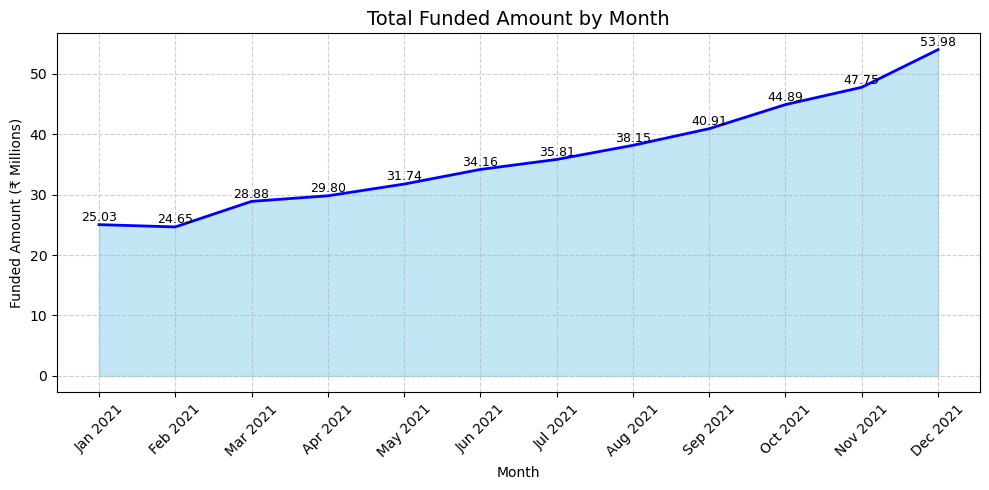

In [79]:
monthly_funded = (
     df. sort_values('issue_date')
       .assign(month_name=lambda x: x['issue_date'].dt.strftime('%b %Y'))
       .groupby('month_name', sort=False) ['loan_amount']
       . sum()
       .div(1_000_000)
       .reset_index(name='loan_amount_millions')
)
plt.figure(figsize=(10, 5))
plt.fill_between(monthly_funded['month_name'], monthly_funded['loan_amount_millions'], color='skyblue', alpha=0.5)
plt.plot(monthly_funded['month_name'], monthly_funded['loan_amount_millions'], color='blue', linewidth=2)
                
for i, row in monthly_funded.iterrows():
      plt.text(i, row['loan_amount_millions'] + 0.1, f"{row['loan_amount_millions']:.2f}",
              ha='center' , va='bottom', fontsize=9, rotation=0, color='black')
                                                                 
plt.title('Total Funded Amount by Month', fontsize=14)
plt.xlabel('Month')
plt.ylabel('Funded Amount (₹ Millions)')
plt.xticks(ticks=range(len(monthly_funded)), labels=monthly_funded['month_name'], rotation=45)
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt. show()


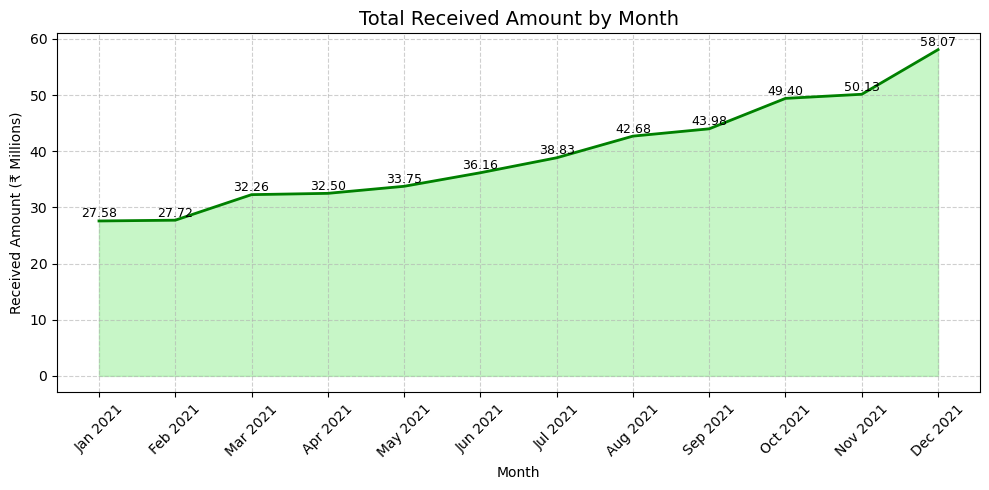

In [80]:
# Monthly received amount calculation
monthly_received = (
    df.sort_values('issue_date')
      .assign(month_name=lambda x: x['issue_date'].dt.strftime('%b %Y'))
      .groupby('month_name', sort=False)['total_payment']
      .sum()
      .div(1_000_000)  # Convert to millions
      .reset_index(name='received_amount_millions')
)

# Plot
plt.figure(figsize=(10, 5))
plt.fill_between(monthly_received['month_name'], monthly_received['received_amount_millions'],
                 color='lightgreen', alpha=0.5)
plt.plot(monthly_received['month_name'], monthly_received['received_amount_millions'],
         color='green', linewidth=2)

# Annotate each data point
for i, row in monthly_received.iterrows():
    plt.text(i, row['received_amount_millions'] + 0.1,
             f"{row['received_amount_millions']:.2f}",
             ha='center', va='bottom', fontsize=9, rotation=0, color='black')

# Titles and labels
plt.title('Total Received Amount by Month', fontsize=14)
plt.xlabel('Month')
plt.ylabel('Received Amount (₹ Millions)')
plt.xticks(ticks=range(len(monthly_received)), labels=monthly_received['month_name'], rotation=45)
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()


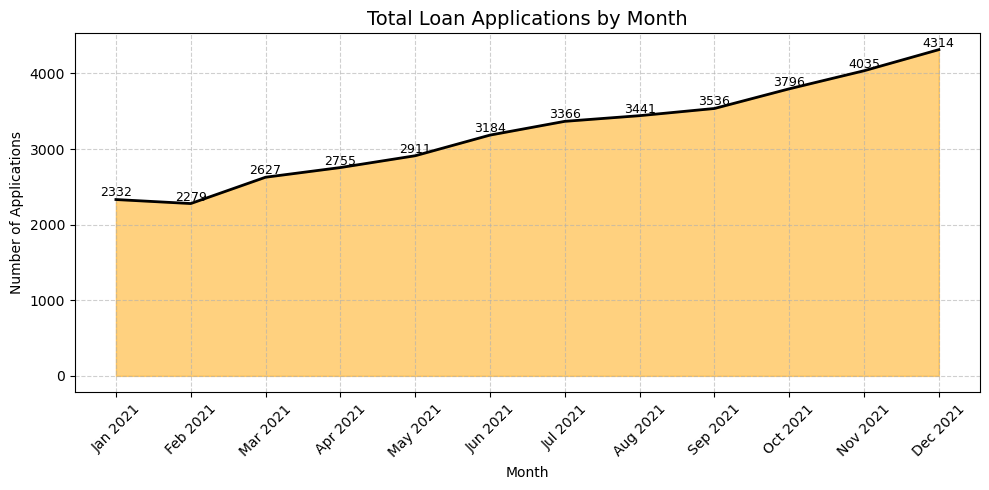

In [82]:
import matplotlib.pyplot as plt

#  Calculate total loan applications per month
monthly_applications = (
    df.sort_values('issue_date')
      .assign(month_name=lambda x: x['issue_date'].dt.strftime('%b %Y'))
      .groupby('month_name', sort=False)['id']
      .count()
      .reset_index(name='loan_applications_count')
)

#  Plot setup
plt.figure(figsize=(10, 5))
plt.fill_between(
    monthly_applications['month_name'],
    monthly_applications['loan_applications_count'],
    color='orange',
    alpha=0.5
)
plt.plot(
    monthly_applications['month_name'],
    monthly_applications['loan_applications_count'],
    color='black',
    linewidth=2
)

#  Add text labels above points
for i, row in monthly_applications.iterrows():
    plt.text(
        i,
        row['loan_applications_count'] + 0.5,
        f"{row['loan_applications_count']}",
        ha='center',
        va='bottom',
        fontsize=9,
        rotation=0,
        color='black'
    )

#  Final plot settings
plt.title('Total Loan Applications by Month', fontsize=14)
plt.xlabel('Month')
plt.ylabel('Number of Applications')
plt.xticks(
    ticks=range(len(monthly_applications)),
    labels=monthly_applications['month_name'],
    rotation=45
)
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()


### Regional Analysis by State

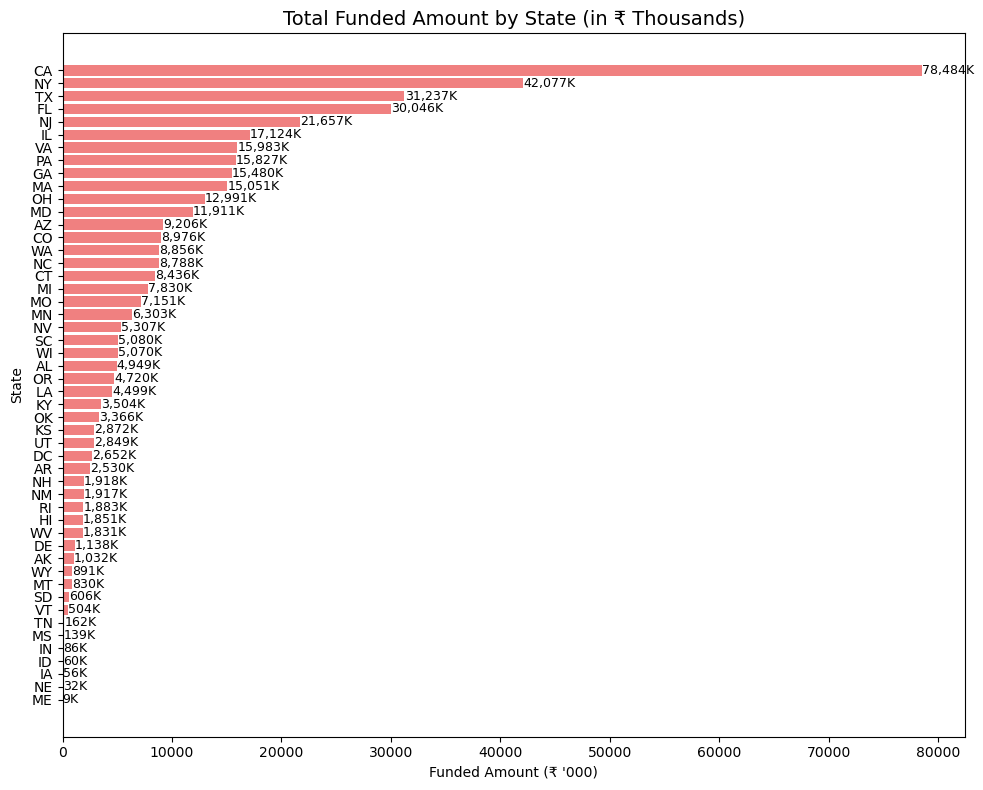

In [84]:
import matplotlib.pyplot as plt

#  Group by state and calculate total loan amount (in thousands)
state_funding = df.groupby('address_state')['loan_amount'].sum().sort_values(ascending=True)
state_funding_thousands = state_funding / 1000

#  Plot horizontal bar chart
plt.figure(figsize=(10, 8))
bars = plt.barh(state_funding_thousands.index, state_funding_thousands.values, color='lightcoral')

# Add text labels to bars
for bar in bars:
    width = bar.get_width()
    plt.text(
        width + 10,
        bar.get_y() + bar.get_height() / 2,
        f'{width:,.0f}K',
        va='center',
        fontsize=9
    )

#  Chart labels and layout
plt.title('Total Funded Amount by State (in ₹ Thousands)', fontsize=14)
plt.xlabel("Funded Amount (₹ \'000)")
plt.ylabel('State')
plt.tight_layout()
plt.show()


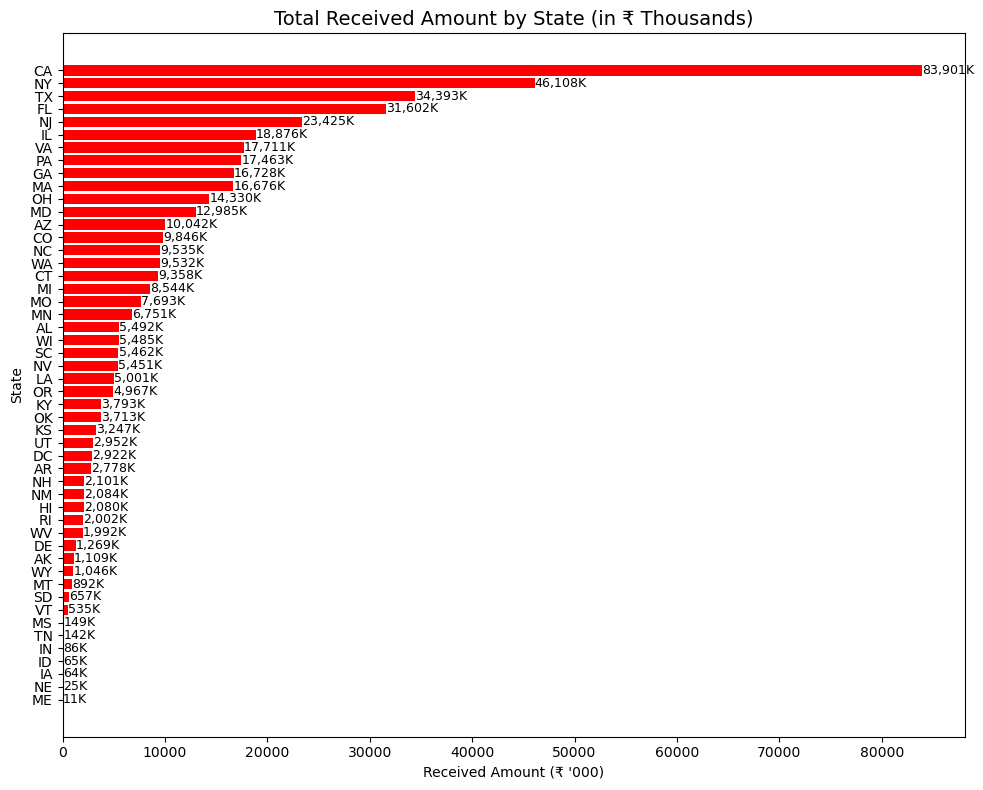

In [86]:
import matplotlib.pyplot as plt

#  Group by state and calculate total loan amount (in thousands)
state_received = df.groupby('address_state')['total_payment'].sum().sort_values(ascending=True)
state_received_thousands = state_received / 1000

#  Plot horizontal bar chart
plt.figure(figsize=(10, 8))
bars = plt.barh(state_received_thousands.index, state_received_thousands.values, color='red')

#  Add text labels to bars
for bar in bars:
    width = bar.get_width()
    plt.text(
        width + 10,
        bar.get_y() + bar.get_height() / 2,
        f'{width:,.0f}K',
        va='center',
        fontsize=9
    )

#  Chart labels and layout
plt.title('Total Received Amount by State (in ₹ Thousands)', fontsize=14)
plt.xlabel("Received Amount (₹ \'000)")
plt.ylabel('State')
plt.tight_layout()
plt.show()

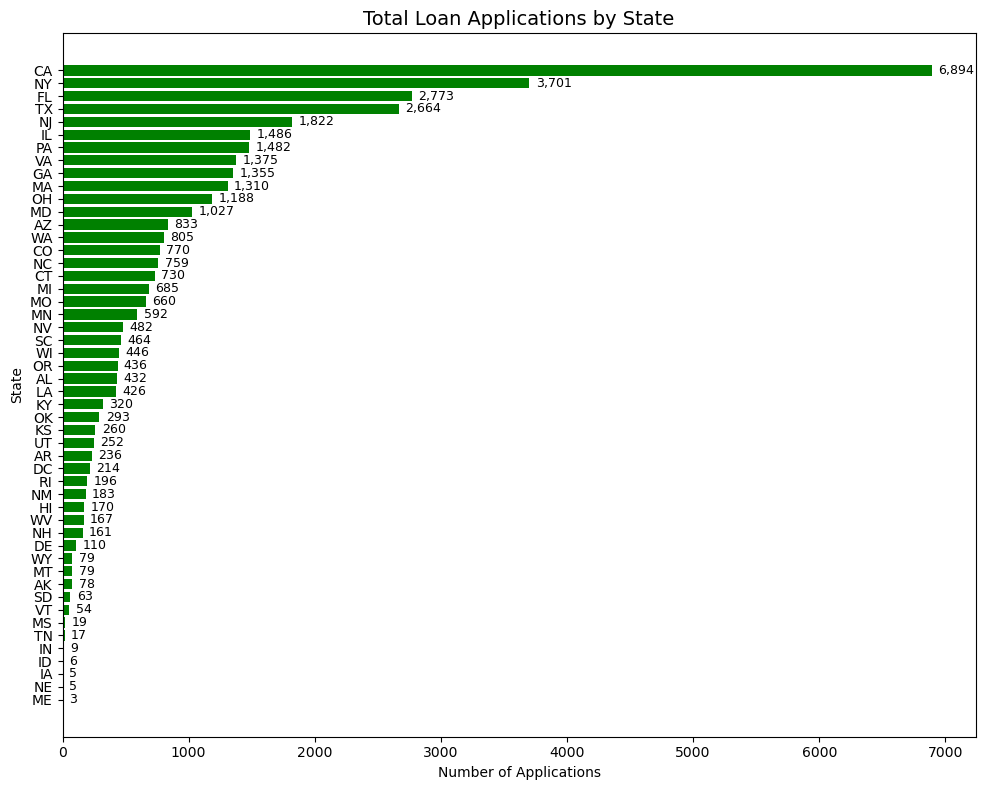

In [97]:
import matplotlib.pyplot as plt

#  Group by state and count total loan applications
state_applications = (
    df.groupby('address_state')['id']
      .count()
      .sort_values(ascending=True)
)

#  Plot horizontal bar chart
plt.figure(figsize=(10, 8))
bars = plt.barh(state_applications.index, state_applications.values, color='green')

#  Add text labels to bars
for bar in bars:
    width = bar.get_width()
    plt.text(
        width + 50,  # adjust spacing based on your data scale
        bar.get_y() + bar.get_height() / 2,
        f'{int(width):,}',  # show plain count (no 'K')
        va='center',
        fontsize=9
    )

#  Chart labels and layout
plt.title('Total Loan Applications by State', fontsize=14)
plt.xlabel("Number of Applications")
plt.ylabel('State')
plt.tight_layout()
plt.show()


 ### Loan Term Analysis

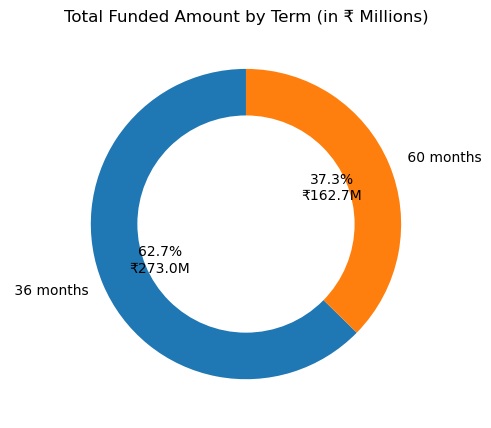

In [100]:
import matplotlib.pyplot as plt

#  Group by loan term and calculate total funded amount (in millions)
term_funding_millions = df.groupby('term')['loan_amount'].sum() / 1_000_000

#  Create a donut pie chart
plt.figure(figsize=(5, 5))
plt.pie(
    term_funding_millions,
    labels=term_funding_millions.index,
    autopct=lambda p: f'{p:.1f}%\n₹{p * sum(term_funding_millions) / 100:.1f}M',
    startangle=90,
    wedgeprops={'width': 0.4}
)

#  Add white circle in the center (donut style)
centre_circle = plt.Circle((0, 0), 0.70, fc='white')
plt.gca().add_artist(centre_circle)

#  Title and display
plt.title("Total Funded Amount by Term (in ₹ Millions)", fontsize=12)
plt.tight_layout()
plt.show()


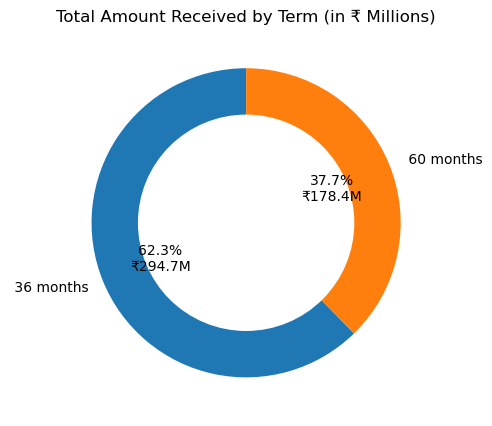

In [101]:
import matplotlib.pyplot as plt

#  Group by loan term and calculate total received amount (in millions)
term_received_millions = df.groupby('term')['total_payment'].sum() / 1_000_000

#  Create a donut pie chart
plt.figure(figsize=(5, 5))
plt.pie(
    term_received_millions,
    labels=term_received_millions.index,
    autopct=lambda p: f'{p:.1f}%\n₹{p * sum(term_received_millions) / 100:.1f}M',
    startangle=90,
    wedgeprops={'width': 0.4}
)

#  Add white circle in the center (donut style)
centre_circle = plt.Circle((0, 0), 0.70, fc='white')
plt.gca().add_artist(centre_circle)

#  Title and display
plt.title("Total Amount Received by Term (in ₹ Millions)", fontsize=12)
plt.tight_layout()
plt.show()


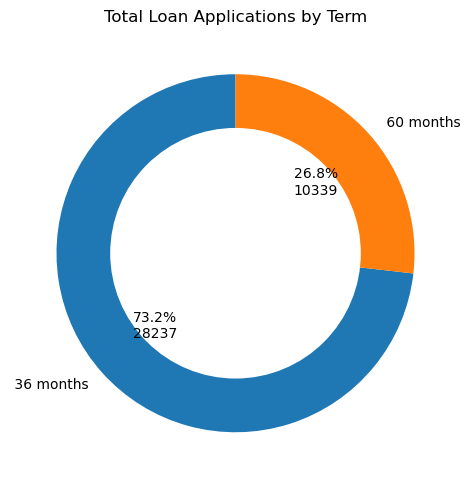

In [102]:
import matplotlib.pyplot as plt

#  Group by loan term and count total loan applications
term_applications = df.groupby('term')['id'].count()

#  Convert to millions (optional — here we keep actual counts)
term_applications_millions = term_applications / 1_000_000  # only for consistency in display

#  Create a donut pie chart
plt.figure(figsize=(5, 5))
plt.pie(
    term_applications_millions,
    labels=term_applications_millions.index,
    autopct=lambda p: f'{p:.1f}%\n{p * sum(term_applications) / 100:.0f}',
    startangle=90,
    wedgeprops={'width': 0.4}
)

#  Add white circle in the center (donut style)
centre_circle = plt.Circle((0, 0), 0.70, fc='white')
plt.gca().add_artist(centre_circle)

#  Title and display
plt.title("Total Loan Applications by Term", fontsize=12)
plt.tight_layout()
plt.show()


### Employee Length Analysis

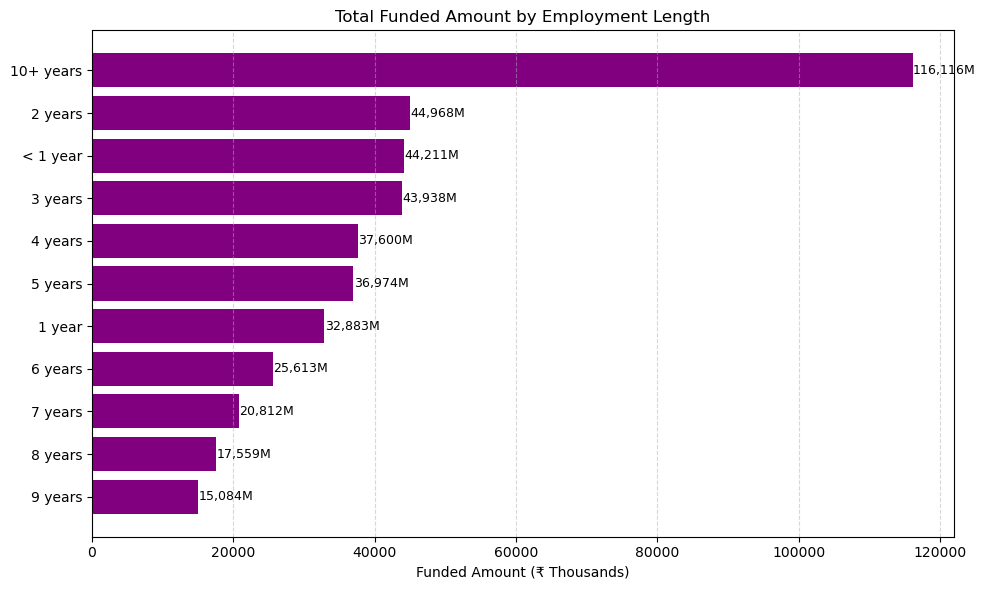

In [104]:
import matplotlib.pyplot as plt

#  Group by employment length and calculate total funded amount (in ₹ Thousands)
emp_funding_thousands = df.groupby('emp_length')['loan_amount'].sum().sort_values() / 1000

#  Create horizontal bar chart
plt.figure(figsize=(10, 6))
bars = plt.barh(emp_funding_thousands.index, emp_funding_thousands.values, color='purple')

#  Add data labels on bars
for bar in bars:
    width = bar.get_width()
    plt.text(
        width + 50,  # adjust based on your scale
        bar.get_y() + bar.get_height() / 2,
        f"{width:,.0f}K",
        va='center',
        fontsize=9
    )

#  Add labels, title, and grid
plt.xlabel("Funded Amount (₹ Thousands)")
plt.title("Total Funded Amount by Employment Length")
plt.grid(axis='x', linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()


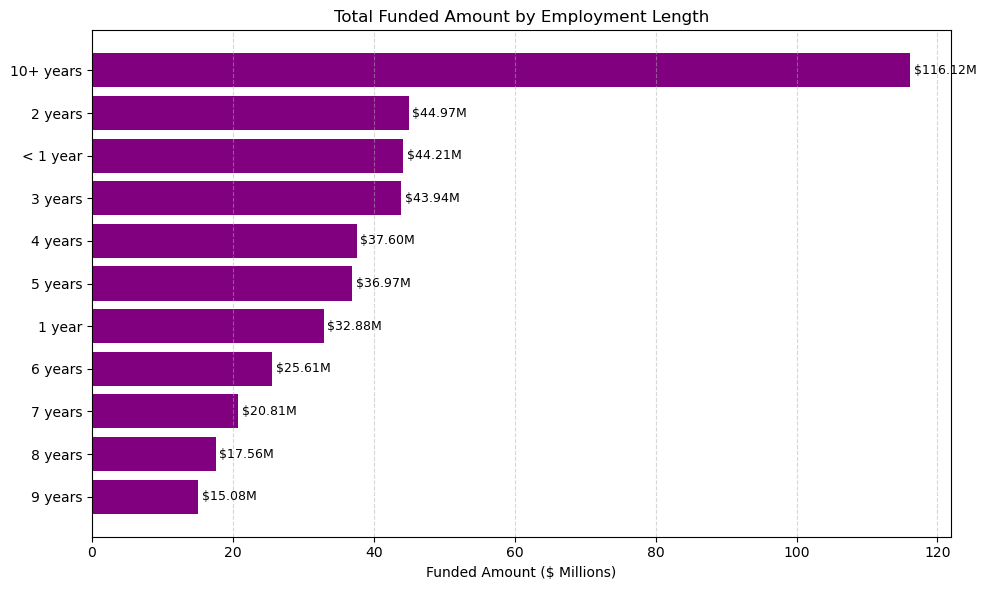

In [110]:
import matplotlib.pyplot as plt

#  Group by employment length and calculate total funded amount (in $ Millions)
emp_funding_millions = df.groupby('emp_length')['loan_amount'].sum().sort_values() / 1_000_000

#  Create horizontal bar chart
plt.figure(figsize=(10, 6))
bars = plt.barh(emp_funding_millions.index, emp_funding_millions.values, color='purple')

#  Add data labels on bars with $
for bar in bars:
    width = bar.get_width()
    plt.text(
        width + 0.5,  # adjust based on your scale
        bar.get_y() + bar.get_height() / 2,
        f"${width:.2f}M",
        va='center',
        fontsize=9
    )

#  Add labels, title, and grid
plt.xlabel("Funded Amount ($ Millions)")
plt.title("Total Funded Amount by Employment Length")
plt.grid(axis='x', linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()


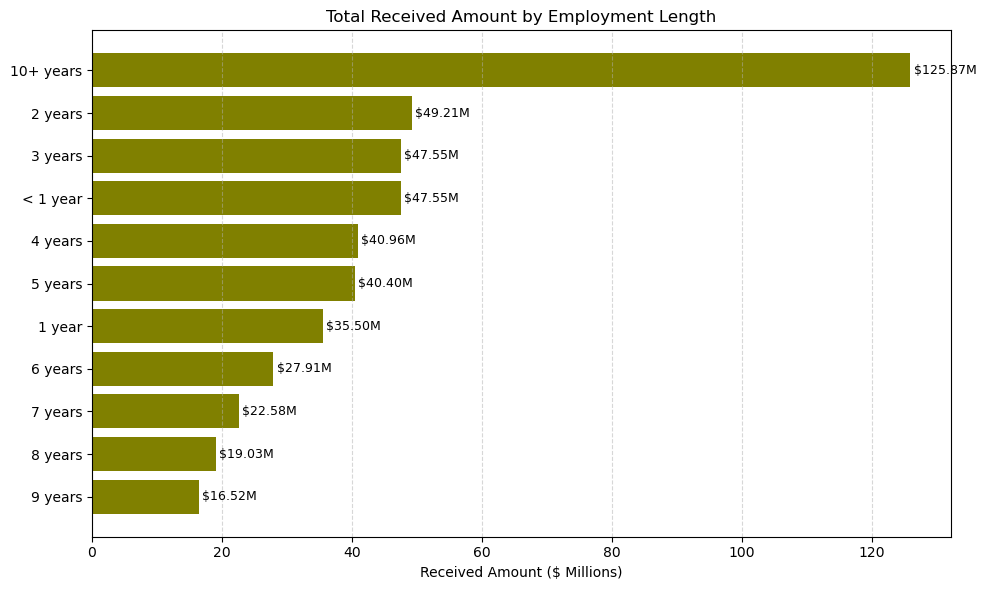

In [113]:
import matplotlib.pyplot as plt

#  Group by employment length and calculate total received amount (in $ Millions)
emp_received_millions = df.groupby('emp_length')['total_payment'].sum().sort_values() / 1_000_000

#  Create horizontal bar chart
plt.figure(figsize=(10, 6))
bars = plt.barh(emp_received_millions.index, emp_received_millions.values, color='olive')

#  Add data labels on bars with $
for bar in bars:
    width = bar.get_width()
    plt.text(
        width + 0.5,  # adjust based on your scale
        bar.get_y() + bar.get_height() / 2,
        f"${width:.2f}M",
        va='center',
        fontsize=9
    )

#  Add labels, title, and grid
plt.xlabel("Received Amount ($ Millions)")
plt.title("Total Received Amount by Employment Length")
plt.grid(axis='x', linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()


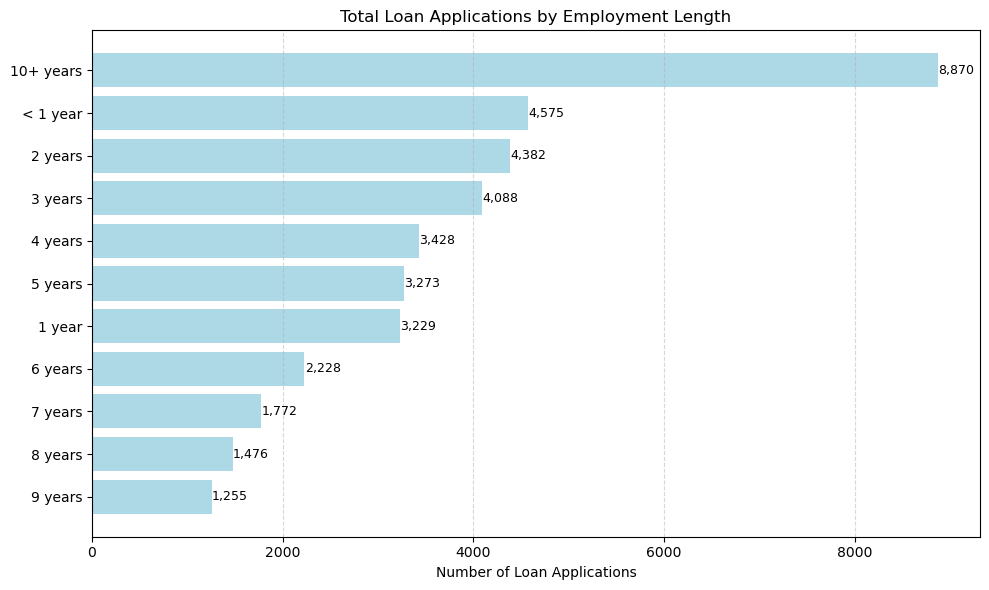

In [117]:
import matplotlib.pyplot as plt

#  Group by employment length and count total loan applications
emp_applications = df.groupby('emp_length')['id'].count().sort_values()

#  Create horizontal bar chart
plt.figure(figsize=(10, 6))
bars = plt.barh(emp_applications.index, emp_applications.values, color='lightblue')

#  Add data labels on bars
for bar in bars:
    width = bar.get_width()
    plt.text(
        width + 5,  # adjust based on scale
        bar.get_y() + bar.get_height() / 2,
        f"{width:,}",  # formatted with commas
        va='center',
        fontsize=9
    )

#  Add labels, title, and grid
plt.xlabel("Number of Loan Applications")
plt.title("Total Loan Applications by Employment Length")
plt.grid(axis='x', linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()


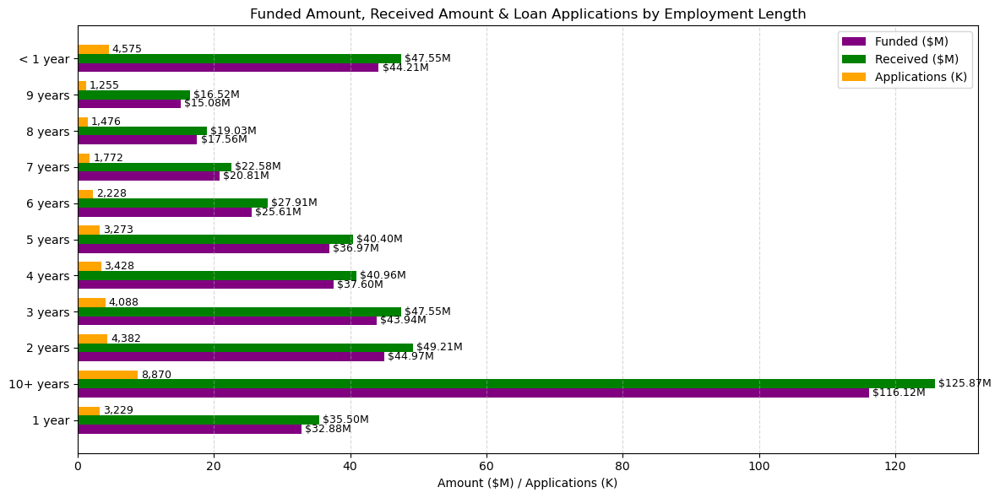

In [118]:
import matplotlib.pyplot as plt
import numpy as np

#  Prepare data
emp_lengths = df['emp_length'].sort_values().unique()

# Funded Amount in $ Millions
funded = df.groupby('emp_length')['loan_amount'].sum() / 1_000_000
# Received Amount in $ Millions
received = df.groupby('emp_length')['total_payment'].sum() / 1_000_000
# Total Loan Applications (count)
applications = df.groupby('emp_length')['id'].count()

# Ensure same order
funded = funded.reindex(emp_lengths)
received = received.reindex(emp_lengths)
applications = applications.reindex(emp_lengths)

#  Plot grouped horizontal bar chart
bar_width = 0.25
y = np.arange(len(emp_lengths))

plt.figure(figsize=(12, 6))
plt.barh(y - bar_width, funded.values, height=bar_width, color='purple', label='Funded ($M)')
plt.barh(y, received.values, height=bar_width, color='green', label='Received ($M)')
plt.barh(y + bar_width, applications.values / 1000, height=bar_width, color='orange', label='Applications (K)')  # scaled to K for better fit

#  Add data labels
for i in range(len(emp_lengths)):
    plt.text(funded.values[i] + 0.5, i - bar_width, f"${funded.values[i]:.2f}M", va='center', fontsize=9)
    plt.text(received.values[i] + 0.5, i, f"${received.values[i]:.2f}M", va='center', fontsize=9)
    plt.text(applications.values[i] / 1000 + 0.5, i + bar_width, f"{applications.values[i]:,}", va='center', fontsize=9)

#  Chart formatting
plt.yticks(y, emp_lengths)
plt.xlabel("Amount ($M) / Applications (K)")
plt.title("Funded Amount, Received Amount & Loan Applications by Employment Length")
plt.legend()
plt.grid(axis='x', linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()


### Loan Purpose Breakdown

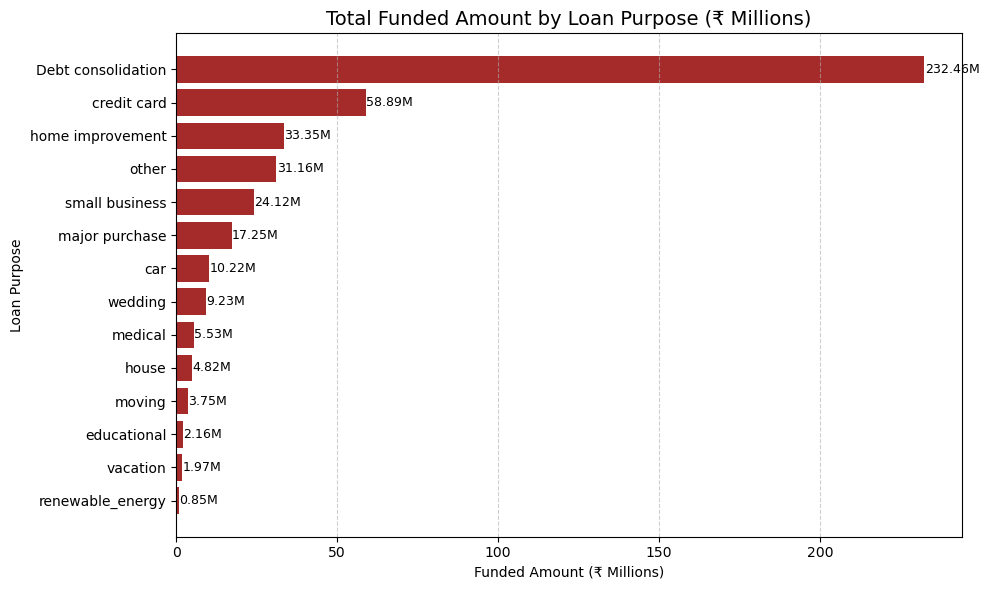

In [121]:
import matplotlib.pyplot as plt

#  Group by purpose and calculate total funded amount (in ₹ Millions)
purpose_funding_millions = df.groupby('purpose')['loan_amount'].sum().sort_values() / 1_000_000

#  Create horizontal bar chart
plt.figure(figsize=(10, 6))
bars = plt.barh(purpose_funding_millions.index, purpose_funding_millions.values, color="brown")

#  Add data labels on bars
for bar in bars:
    width = bar.get_width()
    plt.text(
        width + 0.1, 
        bar.get_y() + bar.get_height()/2,
        f'{width:.2f}M',
        va='center',
        fontsize=9
    )

#  Chart labels and formatting
plt.title('Total Funded Amount by Loan Purpose (₹ Millions)', fontsize=14)
plt.xlabel('Funded Amount (₹ Millions)')
plt.ylabel('Loan Purpose')
plt.grid(axis='x', linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()


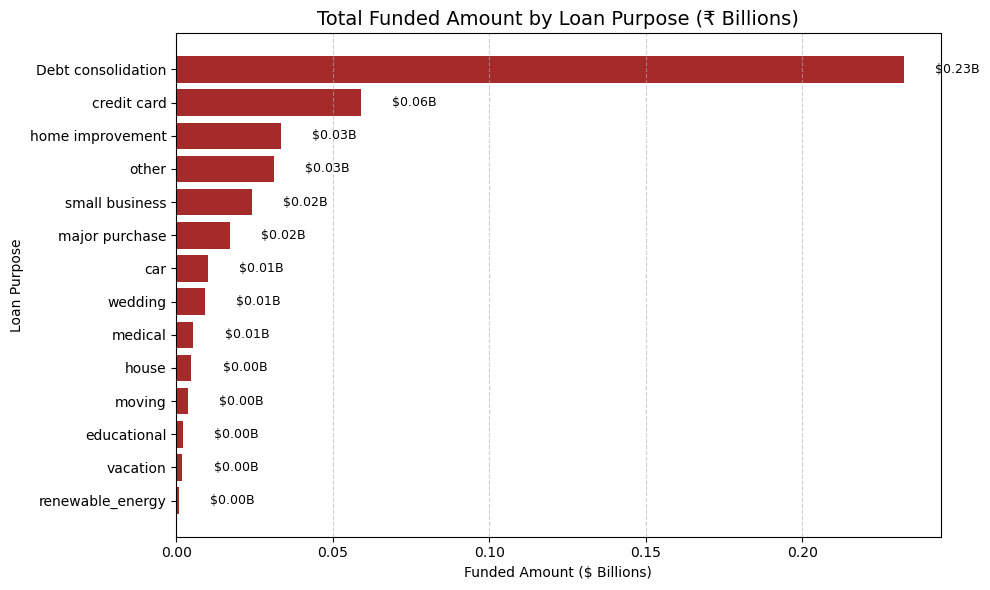

In [124]:
import matplotlib.pyplot as plt

#  Group by purpose and calculate total funded amount (in ₹ Billions)
purpose_funding_billions = df.groupby('purpose')['loan_amount'].sum().sort_values() / 1_000_000_000

#  Create horizontal bar chart
plt.figure(figsize=(10, 6))
bars = plt.barh(purpose_funding_billions.index, purpose_funding_billions.values, color="brown")

#  Add data labels on bars
for bar in bars:
    width = bar.get_width()
    plt.text(
        width + 0.01,  # adjust spacing for billions scale
        bar.get_y() + bar.get_height() / 2,
        f'${width:.2f}B',
        va='center',
        fontsize=9
    )

#  Chart labels and formatting
plt.title('Total Funded Amount by Loan Purpose (₹ Billions)', fontsize=14)
plt.xlabel('Funded Amount ($ Billions)')
plt.ylabel('Loan Purpose')
plt.grid(axis='x', linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()


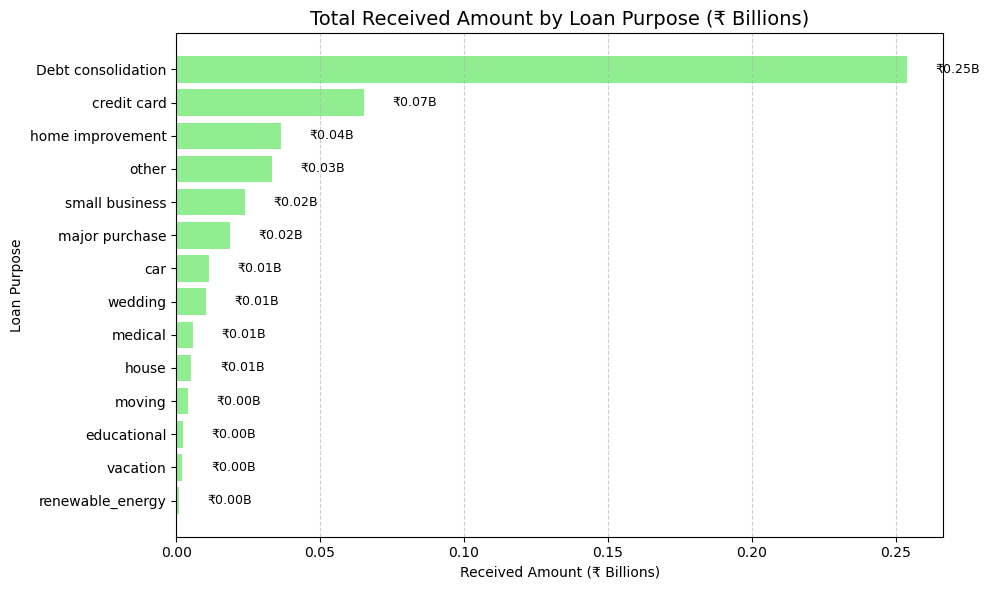

In [125]:
import matplotlib.pyplot as plt

#  Group by purpose and calculate total received amount (in ₹ Billions)
purpose_received_billions = df.groupby('purpose')['total_payment'].sum().sort_values() / 1_000_000_000

#  Create horizontal bar chart
plt.figure(figsize=(10, 6))
bars = plt.barh(purpose_received_billions.index, purpose_received_billions.values, color="lightgreen")

#  Add data labels on bars
for bar in bars:
    width = bar.get_width()
    plt.text(
        width + 0.01,  # adjust spacing for billions scale
        bar.get_y() + bar.get_height() / 2,
        f'₹{width:.2f}B',
        va='center',
        fontsize=9
    )

#  Chart labels and formatting
plt.title('Total Received Amount by Loan Purpose (₹ Billions)', fontsize=14)
plt.xlabel('Received Amount (₹ Billions)')
plt.ylabel('Loan Purpose')
plt.grid(axis='x', linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()


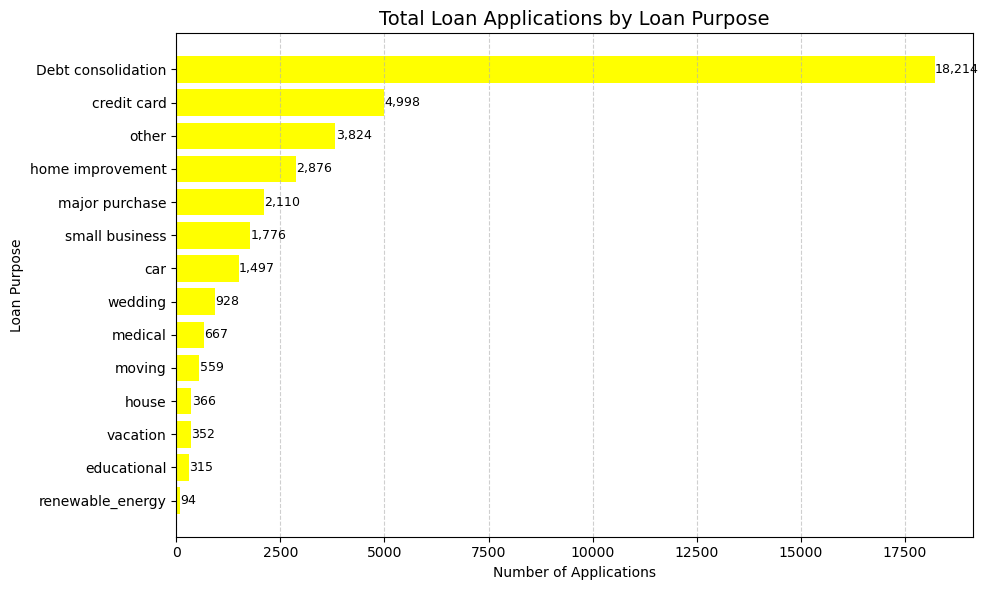

In [127]:
import matplotlib.pyplot as plt

#  Group by purpose and count total loan applications
purpose_applications = df.groupby('purpose')['id'].count().sort_values()

#  Create horizontal bar chart
plt.figure(figsize=(10, 6))
bars = plt.barh(purpose_applications.index, purpose_applications.values, color="yellow")

#  Add data labels on bars
for bar in bars:
    width = bar.get_width()
    plt.text(
        width + 5,  # adjust spacing
        bar.get_y() + bar.get_height() / 2,
        f"{width:,}",  # formatted with commas
        va='center',
        fontsize=9
    )

#  Chart labels and formatting
plt.title('Total Loan Applications by Loan Purpose', fontsize=14)
plt.xlabel('Number of Applications')
plt.ylabel('Loan Purpose')
plt.grid(axis='x', linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()


C:\Users\chait\AppData\Local\Temp\ipykernel_10224\2588345941.py:4: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  plt.text(funded[i], received[i], purpose, fontsize=9)


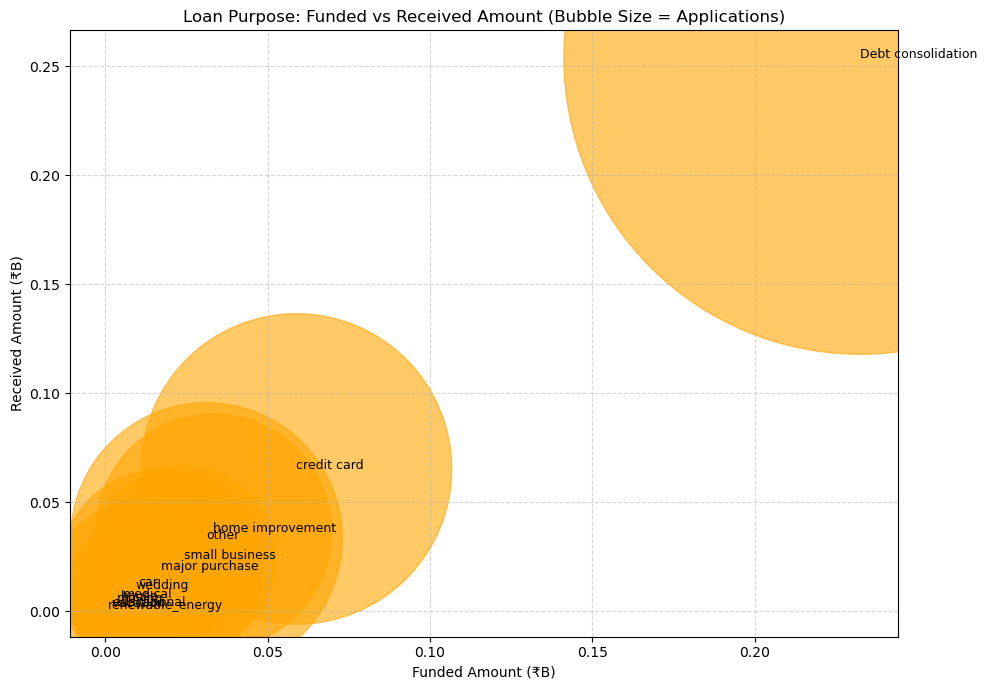

In [129]:
plt.figure(figsize=(10, 7))
plt.scatter(funded, received, s=applications.values*10, alpha=0.6, c='orange')
for i, purpose in enumerate(purposes):
    plt.text(funded[i], received[i], purpose, fontsize=9)

plt.xlabel("Funded Amount (₹B)")
plt.ylabel("Received Amount (₹B)")
plt.title("Loan Purpose: Funded vs Received Amount (Bubble Size = Applications)")
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()


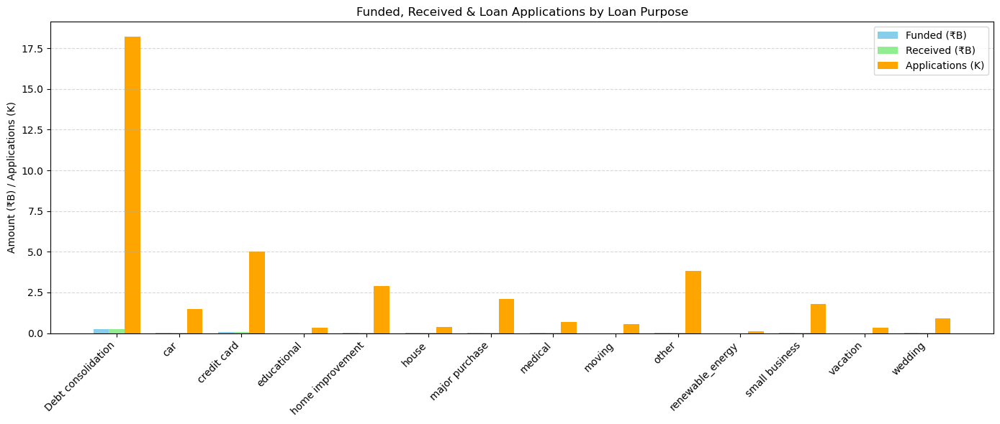

In [130]:
x = np.arange(len(purposes))
width = 0.25

plt.figure(figsize=(14, 6))
plt.bar(x - width, funded.values, width, label='Funded (₹B)', color='skyblue')
plt.bar(x, received.values, width, label='Received (₹B)', color='lightgreen')
plt.bar(x + width, applications.values / 1000, width, label='Applications (K)', color='orange')

plt.xticks(x, purposes, rotation=45, ha='right')
plt.ylabel("Amount (₹B) / Applications (K)")
plt.title("Funded, Received & Loan Applications by Loan Purpose")
plt.legend()
plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()


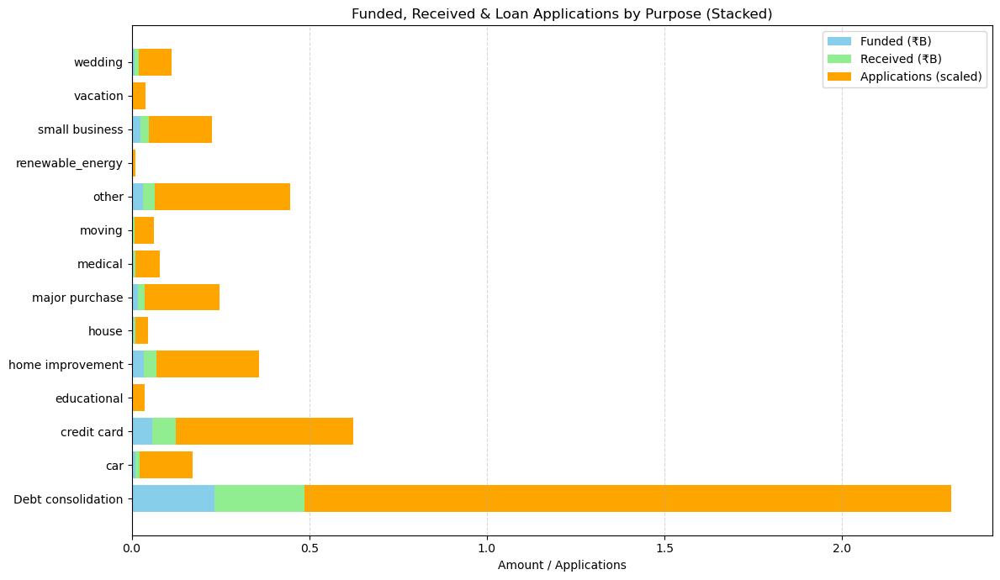

In [131]:
import matplotlib.pyplot as plt
import numpy as np

purposes = df['purpose'].sort_values().unique()
funded = df.groupby('purpose')['loan_amount'].sum() / 1_000_000_000
received = df.groupby('purpose')['total_payment'].sum() / 1_000_000_000
applications = df.groupby('purpose')['id'].count() / 1000  # in K

funded = funded.reindex(purposes)
received = received.reindex(purposes)
applications = applications.reindex(purposes)

plt.figure(figsize=(12, 7))
plt.barh(purposes, funded.values, color='skyblue', label='Funded (₹B)')
plt.barh(purposes, received.values, left=funded.values, color='lightgreen', label='Received (₹B)')
plt.barh(purposes, applications.values / 10, left=funded.values + received.values, color='orange', label='Applications (scaled)')

plt.xlabel("Amount / Applications")
plt.title("Funded, Received & Loan Applications by Purpose (Stacked)")
plt.legend()
plt.grid(axis='x', linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()


C:\Users\chait\AppData\Local\Temp\ipykernel_10224\991192436.py:18: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  plt.text(funded[i], received[i], purpose, fontsize=9, ha='center', va='center')


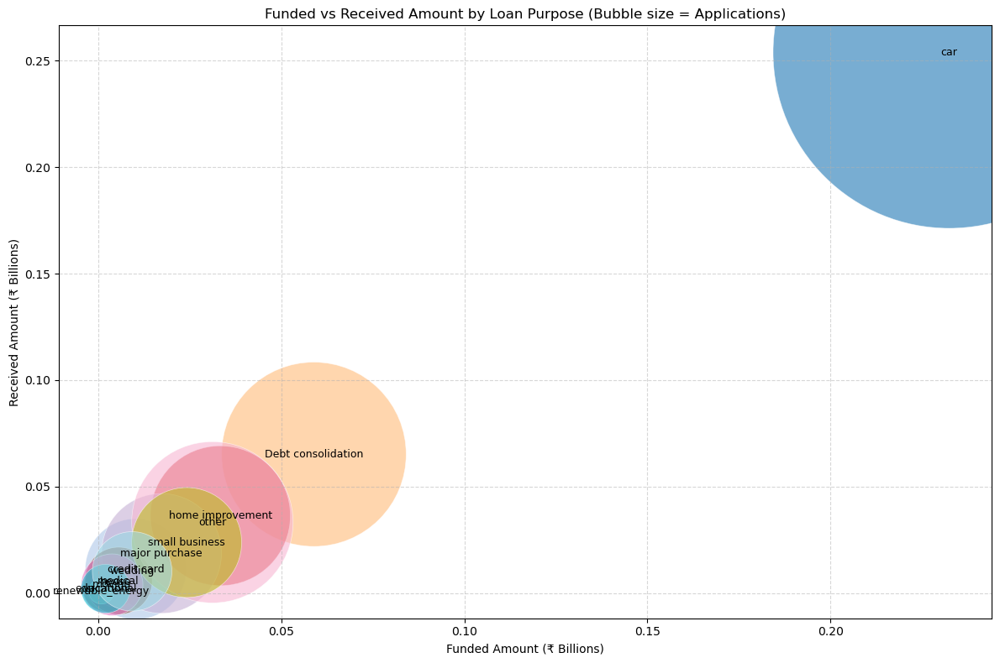

In [132]:
import matplotlib.pyplot as plt

# Prepare data
purposes = df['purpose'].unique()
funded = df.groupby('purpose')['loan_amount'].sum() / 1_000_000_000    # ₹ Billions
received = df.groupby('purpose')['total_payment'].sum() / 1_000_000_000  # ₹ Billions
applications = df.groupby('purpose')['id'].count()  # Count of applications

# Scale bubble sizes for better visibility
bubble_size = applications.values * 5  # adjust multiplier as needed

# Create bubble chart
plt.figure(figsize=(12, 8))
scatter = plt.scatter(funded, received, s=bubble_size, alpha=0.6, c=np.arange(len(purposes)), cmap='tab20', edgecolors='w', linewidth=0.5)

# Add labels for each purpose
for i, purpose in enumerate(purposes):
    plt.text(funded[i], received[i], purpose, fontsize=9, ha='center', va='center')

# Chart formatting
plt.xlabel("Funded Amount (₹ Billions)")
plt.ylabel("Received Amount (₹ Billions)")
plt.title("Funded vs Received Amount by Loan Purpose (Bubble size = Applications)")
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()


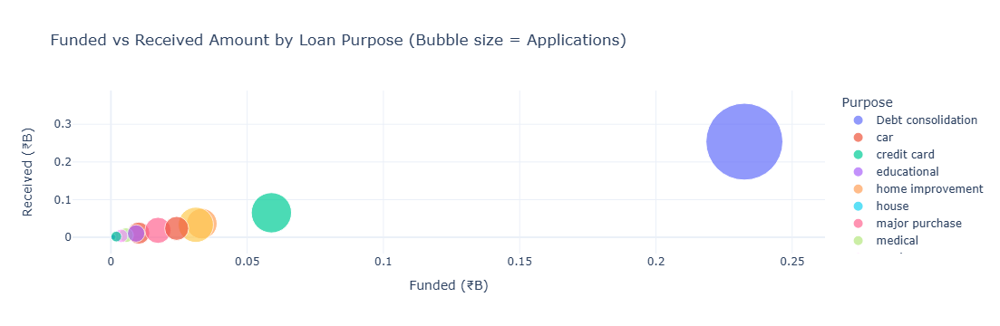

In [133]:
import plotly.express as px

# Prepare data
funded = df.groupby('purpose')['loan_amount'].sum() / 1_000_000_000  # ₹ Billions
received = df.groupby('purpose')['total_payment'].sum() / 1_000_000_000  # ₹ Billions
applications = df.groupby('purpose')['id'].count()  # Number of applications
purposes = df.groupby('purpose').size().index  # Purpose names

# Create a DataFrame for Plotly
import pandas as pd
bubble_df = pd.DataFrame({
    'Purpose': purposes,
    'Funded (₹B)': funded.values,
    'Received (₹B)': received.values,
    'Applications': applications.values
})

# Create interactive bubble chart
fig = px.scatter(
    bubble_df,
    x='Funded (₹B)',
    y='Received (₹B)',
    size='Applications',        # Bubble size
    color='Purpose',            # Bubble color
    hover_name='Purpose',
    hover_data={
        'Funded (₹B)': ':.2f',
        'Received (₹B)': ':.2f',
        'Applications': True
    },
    size_max=60,                # Maximum bubble size
    template='plotly_white',
    title='Funded vs Received Amount by Loan Purpose (Bubble size = Applications)'
)

# Show interactive chart
fig.show()


### Home OwnerShip Analysis

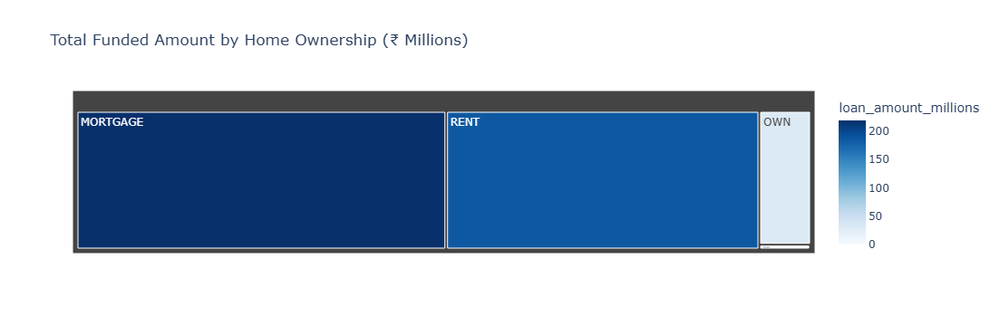

In [135]:
import plotly.express as px

#  Group by home ownership and calculate total funded amount
home_funding = df.groupby('home_ownership')['loan_amount'].sum().reset_index()
home_funding['loan_amount_millions'] = home_funding['loan_amount'] / 1_000_000

#  Create treemap
fig = px.treemap(
    home_funding,
    path=['home_ownership'],
    values='loan_amount_millions',
    color='loan_amount_millions',
    color_continuous_scale='Blues',
    title='Total Funded Amount by Home Ownership (₹ Millions)'
)

#  Show interactive treemap
fig.show()


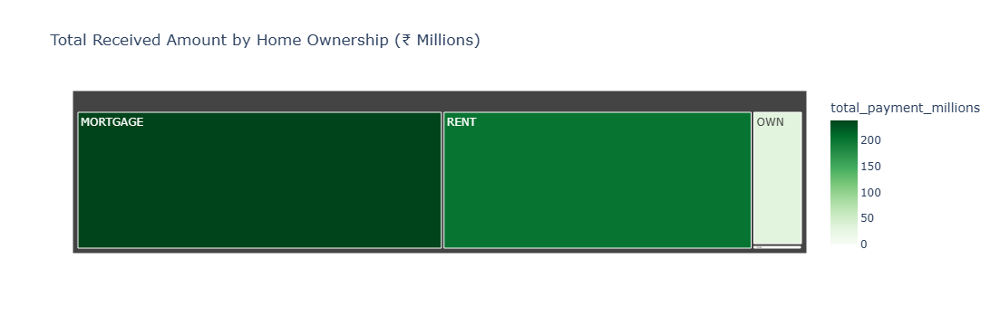

In [136]:
import plotly.express as px

# Group by home ownership and calculate total received amount
home_received = df.groupby('home_ownership')['total_payment'].sum().reset_index()
home_received['total_payment_millions'] = home_received['total_payment'] / 1_000_000

#  Create treemap
fig = px.treemap(
    home_received,
    path=['home_ownership'],
    values='total_payment_millions',
    color='total_payment_millions',
    color_continuous_scale='Greens',
    title='Total Received Amount by Home Ownership (₹ Millions)'
)

#  Show interactive treemap
fig.show()


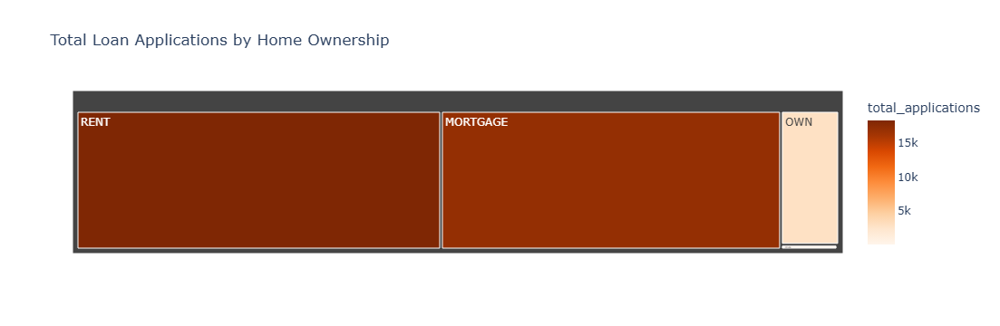

In [137]:
import plotly.express as px

#  Group by home ownership and calculate total loan applications
home_applications = df.groupby('home_ownership')['id'].count().reset_index()
home_applications.rename(columns={'id': 'total_applications'}, inplace=True)

#  Create treemap
fig = px.treemap(
    home_applications,
    path=['home_ownership'],
    values='total_applications',
    color='total_applications',
    color_continuous_scale='Oranges',
    title='Total Loan Applications by Home Ownership'
)

#  Show interactive treemap
fig.show()


###  Correlation Matrix (Heatmap)

Shows relationships between numeric features — e.g., how loan_amount, funded_amount, total_payment, and interest_rate are related.

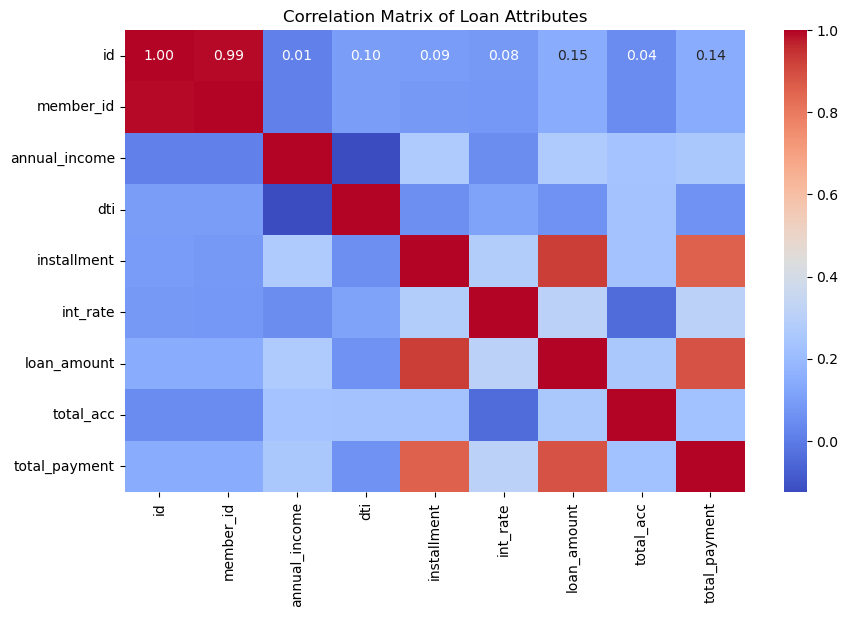

In [141]:
import seaborn as sns
import matplotlib.pyplot as plt

# Select only numeric columns
num_df = df.select_dtypes(include=['float64', 'int64'])

# Compute correlation
corr = num_df.corr()

# Plot heatmap
plt.figure(figsize=(10, 6))
sns.heatmap(corr, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix of Loan Attributes')
plt.show()


###  Loan Default Risk vs Home Ownership (Heatmap or Mosaic)

Check default ratio by home ownership type.

C:\Users\chait\anaconda3\Lib\site-packages\seaborn\matrix.py:260: FutureWarning:

Format strings passed to MaskedConstant are ignored, but in future may error or produce different behavior



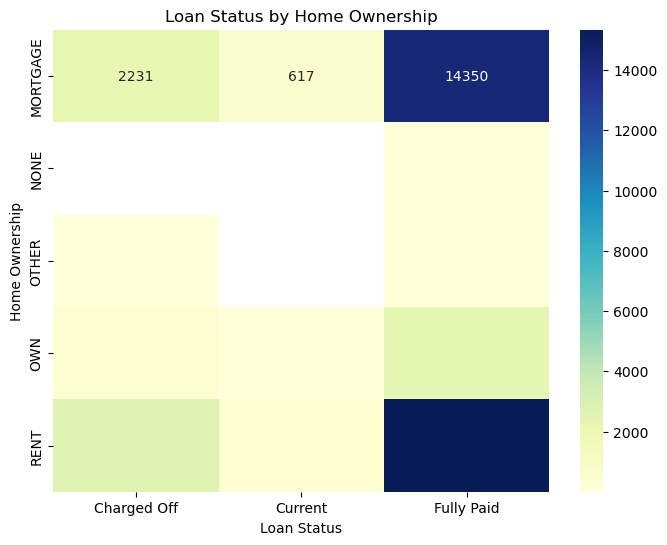

In [144]:
import seaborn as sns
import matplotlib.pyplot as plt

# Group by home ownership and loan status
status_home = df.groupby(['home_ownership', 'loan_status']).size().reset_index(name='count')

# Pivot to create matrix
pivot_df = status_home.pivot(index='home_ownership', columns='loan_status', values='count')

# Plot heatmap
plt.figure(figsize=(8,6))
sns.heatmap(pivot_df, annot=True, fmt='.0f', cmap='YlGnBu')
plt.title('Loan Status by Home Ownership')
plt.xlabel('Loan Status')
plt.ylabel('Home Ownership')
plt.show()


### Loan Amount vs Interest Rate (Bubble Chart)

Shows how interest rate changes with loan amount, grouped by grade.

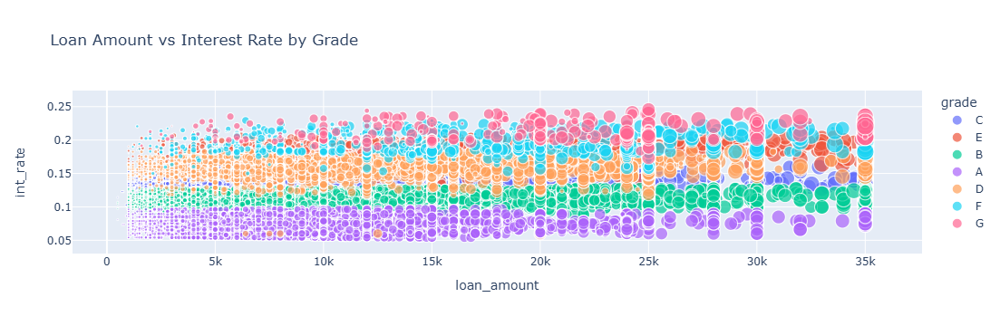

In [146]:
import plotly.express as px

fig = px.scatter(
    df,
    x='loan_amount',
    y='int_rate',  #  correct column name
    size='total_payment',
    color='grade',
    hover_data=['home_ownership'],
    title='Loan Amount vs Interest Rate by Grade'
)
fig.show()



### Income vs Loan Amount (Box Plot)

Understand loan amount distribution across income ranges.

C:\Users\chait\anaconda3\Lib\site-packages\plotly\express\_core.py:1958: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



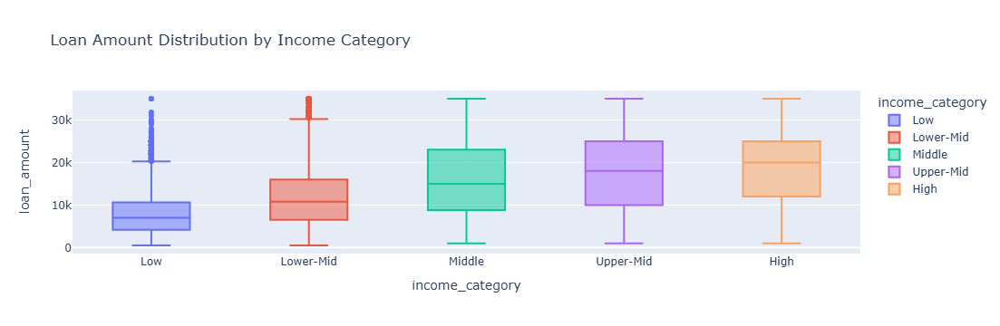

In [149]:
import plotly.express as px
import pandas as pd

#  Create income category based on annual_income
bins = [0, 50000, 100000, 150000, 200000, float('inf')]
labels = ['Low', 'Lower-Mid', 'Middle', 'Upper-Mid', 'High']
df['income_category'] = pd.cut(df['annual_income'], bins=bins, labels=labels)

#  Now plot
fig = px.box(
    df,
    x='income_category',
    y='loan_amount',
    color='income_category',
    title='Loan Amount Distribution by Income Category'
)
fig.show()



### Correlation Matrix Visualization

We’ll compute correlations among all numeric features and visualize them

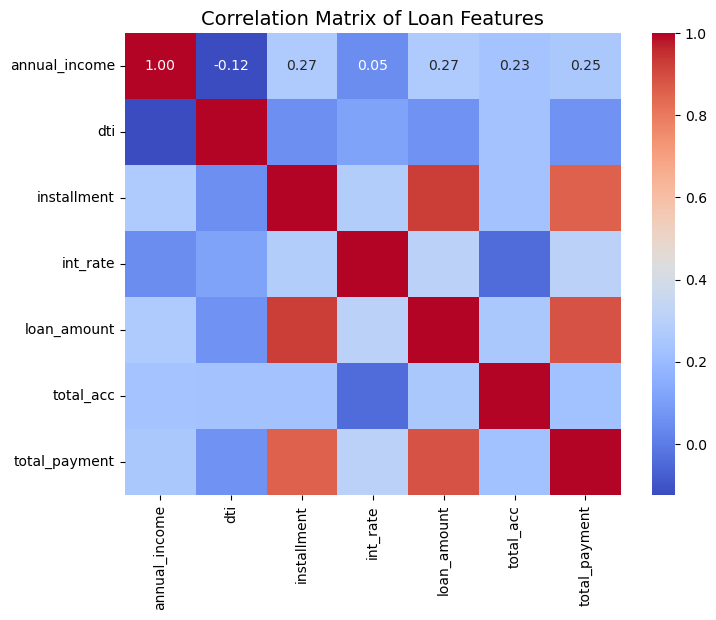

In [150]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Select numeric columns
num_cols = ['annual_income', 'dti', 'installment', 'int_rate', 'loan_amount', 'total_acc', 'total_payment']

# Compute correlation matrix
corr = df[num_cols].corr()

# Plot heatmap
plt.figure(figsize=(8,6))
sns.heatmap(corr, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Matrix of Loan Features', fontsize=14)
plt.show()


### Distribution & Risk Analysis


### Histogram or KDE Plot

Columns: int_rate, annual_income, loan_amount, dti
Goal: Understand borrower or loan distribution patterns.

C:\Users\chait\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



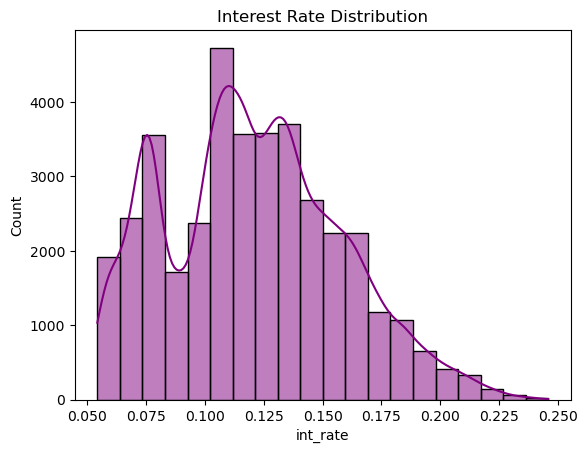

In [152]:
sns.histplot(df['int_rate'], bins=20, kde=True, color='purple')
plt.title("Interest Rate Distribution")
plt.show()


### Box Plot — Risk by Grade or Home Ownership

Columns: grade, int_rate

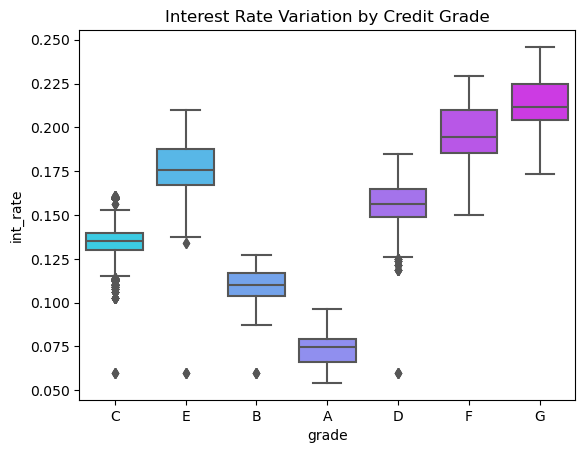

In [153]:
sns.boxplot(data=df, x='grade', y='int_rate', palette='cool')
plt.title("Interest Rate Variation by Credit Grade")
plt.show()


### Stacked Bar Chart — Home Ownership vs Loan Status

Columns: home_ownership, loan_status

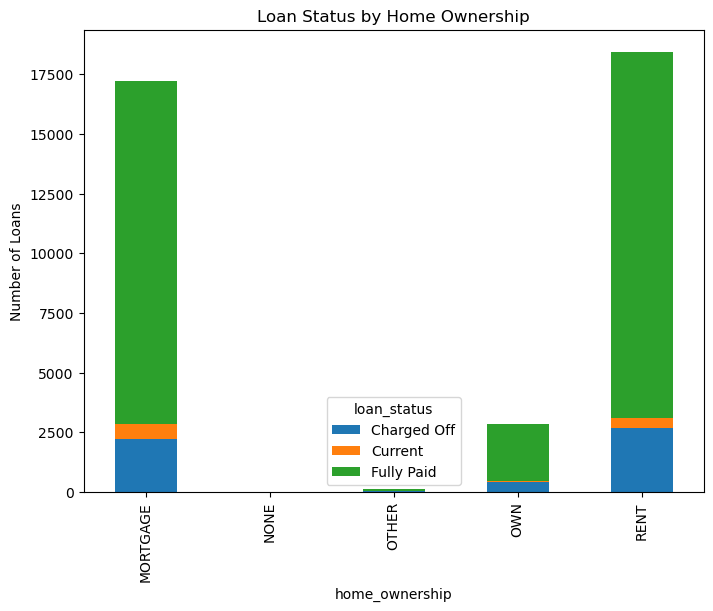

In [155]:
pd.crosstab(df['home_ownership'], df['loan_status']).plot(kind='bar', stacked=True, figsize=(8,6))
plt.title("Loan Status by Home Ownership")
plt.ylabel("Number of Loans")
plt.show()


### Relationship Analysis

### Scatter Plot — DTI vs Interest Rate                                                                                                                 Columns: dti, int_rate

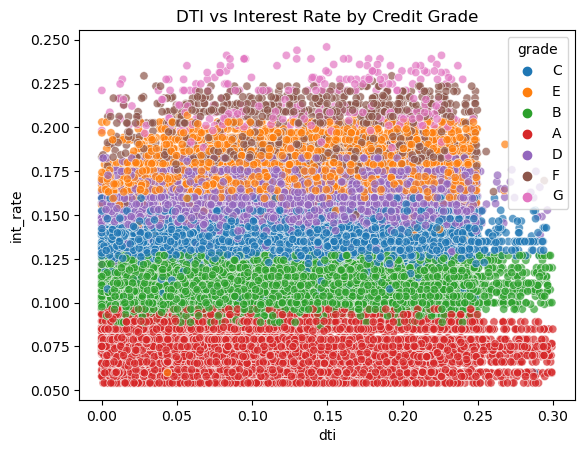

In [156]:
sns.scatterplot(data=df, x='dti', y='int_rate', hue='grade', alpha=0.7)
plt.title("DTI vs Interest Rate by Credit Grade")
plt.show()


### Pair Plot — Relationship Grid

Columns: numeric ones (annual_income, loan_amount, dti, int_rate)

C:\Users\chait\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

C:\Users\chait\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

C:\Users\chait\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

C:\Users\chait\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



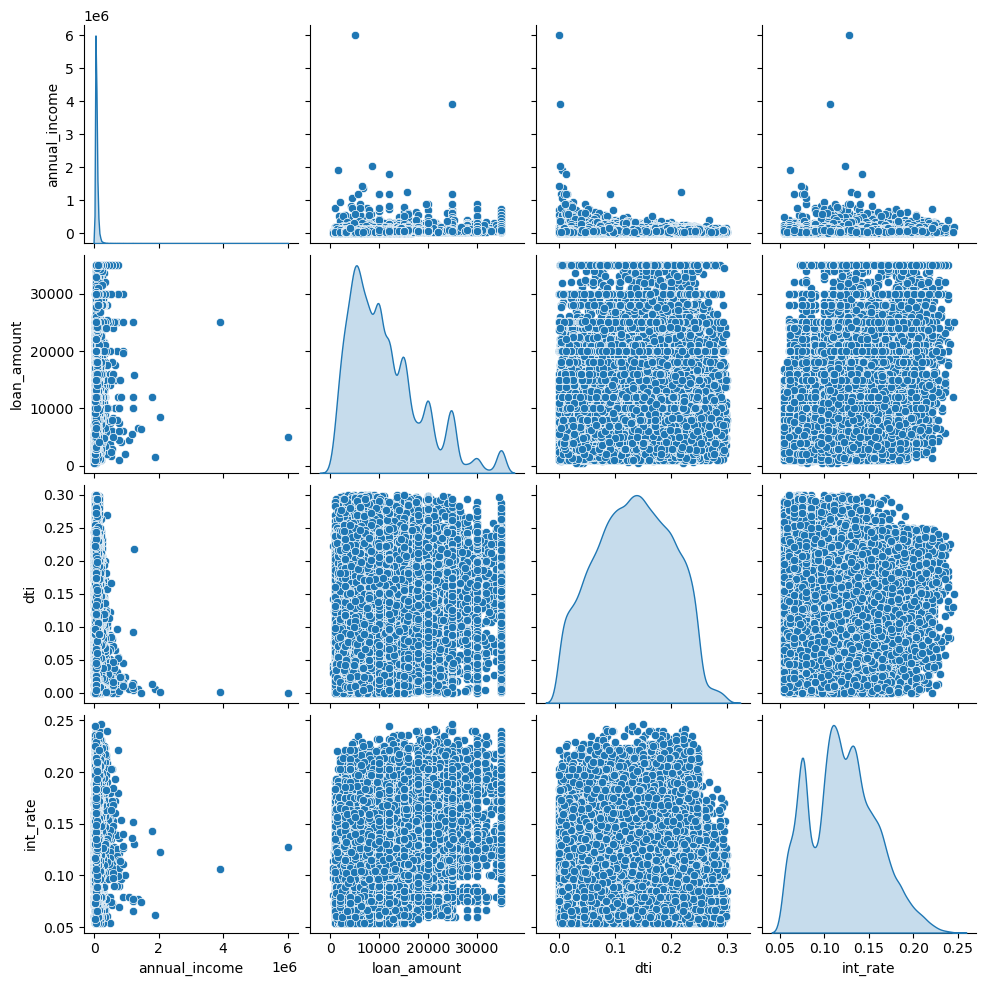

In [157]:
sns.pairplot(df[['annual_income', 'loan_amount', 'dti', 'int_rate']], diag_kind='kde')
plt.show()


### Categorical Insights

### Treemap — Purpose vs Funded Amount

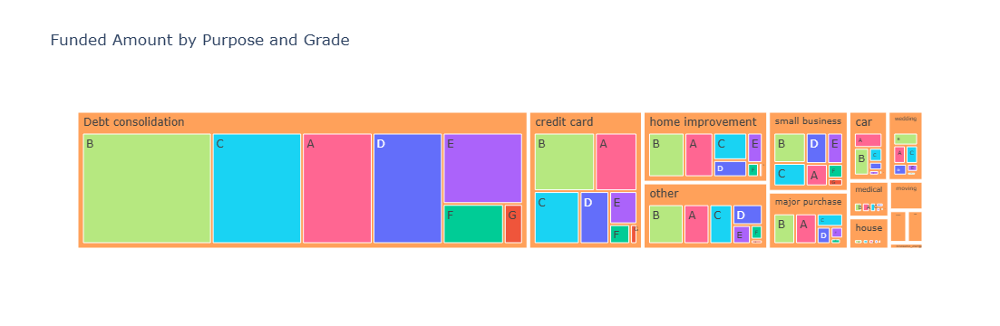

In [158]:
import plotly.express as px

fig = px.treemap(df, path=['purpose', 'grade'], values='loan_amount',
                 color='grade', title='Funded Amount by Purpose and Grade')
fig.show()


### Time Trends

If your dataset has issue_date, we can do:

Time Series — Loan Volume Over Time

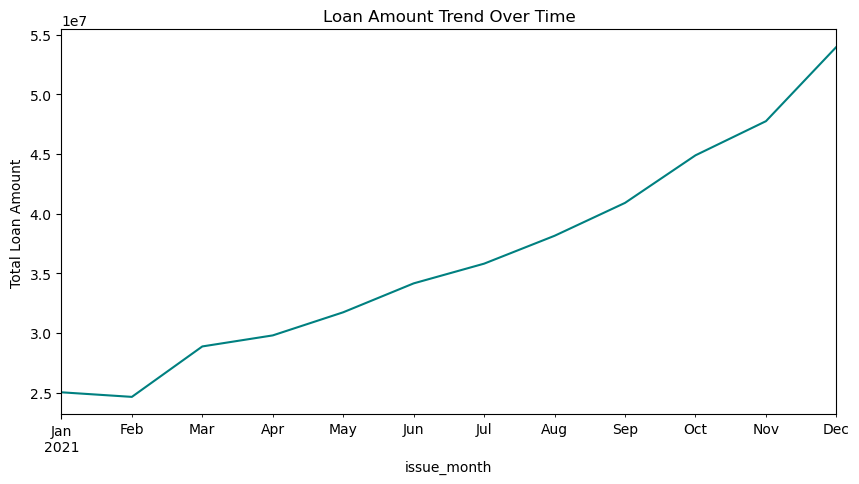

In [159]:
df['issue_month'] = pd.to_datetime(df['issue_date']).dt.to_period('M')
loan_trend = df.groupby('issue_month')['loan_amount'].sum()

loan_trend.plot(figsize=(10,5), color='teal')
plt.title("Loan Amount Trend Over Time")
plt.ylabel("Total Loan Amount")
plt.show()
